<a href="https://colab.research.google.com/github/camila-cg/slips-to-slips/blob/main/DS_Challenge.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Intelie Data Scientist Challenge - in/off slips detection.
<br>Rio de Janeiro/RJ - Brazil
<br>Jan/2023

---


**challenge_data.csv**

The file `challenge_data.csv` contains data collected by sensors in a rig during a tripping out operation. We expect that the data has a sample rate of 2 samples per second.

The file has the following columns:
* index: timestamp in ms
* BDEP: bit depth in m
* TPO: fluid flow in gpm
* HL: hook load in klbf
* BHT: block position in m
* RPM: rotary speed in rpm
* TOR: torque in klbf-ft
* DEPT: hole depth in m
* WOB: weight on bit in klbf


**challenge_annotation.csv**

The file `challenge_annotation.csv` contains annotated data on the classification change points, i.e., the timestamp of an 'off_slips' annotation marks the beggining of the 'off_slips' state, it remains unchanges until the timestamp of the next annotation.

The file has the following columns:
* index: timestamp in ms
* Annotation: annotations

Imports

In [666]:
import pandas as pd
import numpy as np
from math import sqrt

import matplotlib.pyplot as plt
# from matplotlib import pyplot
import seaborn as sns

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

from sklearn.preprocessing import minmax_scale
# from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn import metrics

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

Fixing seed for reproducibility

In [667]:
np.random.seed(42)

# Part I: Exploratory Data Analysis (EDA)

Reading the dataset and the annotations

In [668]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [669]:
data_df = pd.read_csv('./drive/MyDrive/I by V/data/challenge_data.csv')
annotation_df = pd.read_csv('./drive/MyDrive/I by V/data/challenge_annotation.csv')

### Dimensions

Dimension of the dataset 

In [670]:
data_df.shape

(40673, 9)

The dataset has 40.673 observations and 9 features. Here, the terms `features` and `columns` means the same, as well as `observations` and `rows`.

Dimension of the annotations

In [671]:
annotation_df.shape

(109, 2)

In the annotation's file there are 109 rows and 2 columns.

### Data types

Data type of all features in the dataset

In [672]:
data_df.dtypes

Unnamed: 0    float64
BDEP          float64
TPO           float64
HL            float64
BHT           float64
RPM           float64
TOR           float64
DEPT          float64
WOB           float64
dtype: object

From the result above, we can see that the whole dataset is composed by **continuous numbers**. A point that needs to be further analyzed in the future is if there are some numerical feature that could/should become categorical.

Data type of annotations

In [673]:
annotation_df.dtypes

Unnamed: 0    float64
Annotation     object
dtype: object

In the annotations there is one numerical feature, representing the timestamp's measures and a categorical feature with the target on that timestamp. The annotation data create a timelime with intervals and their respective target. 

### Data transformation

Sample of the dataset

In [674]:
data_df.sample(5)

,Unnamed: 0,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB
5478,1.607133e+12,4761.651,0.000000,480.803988,24.401,0.0,0.0,5795.817,-1.98
6769,1.607134e+12,4689.055,203.940813,470.303988,22.840,0.0,0.0,5795.817,8.52
1487,1.607131e+12,4977.685,0.000000,510.345987,30.420,0.0,0.0,5795.817,2.62
532,1.607131e+12,5038.508,0.000000,509.931987,6.560,0.0,0.0,5795.817,25.96
40169,1.607151e+12,3077.834,0.000000,361.523991,39.324,0.0,0.0,5795.817,-0.53


❗  - The index column must be renamed for something more semantically reasonable in both dataframes

In [675]:
data_df.rename(columns={'Unnamed: 0': 'TIMESTAMP'}, inplace=True)
annotation_df.rename(columns={'Unnamed: 0': 'TIMESTAMP'}, inplace=True)
print(data_df.columns)
print(annotation_df.columns)

Index(['TIMESTAMP', 'BDEP', 'TPO', 'HL', 'BHT', 'RPM', 'TOR', 'DEPT', 'WOB'], dtype='object')
Index(['TIMESTAMP', 'Annotation'], dtype='object')


The `data_df` is our dataset, with the metrics collected by sensors. First of all, for each observation in this dataset, it's necessary to identify based on the `annotation_df` if the slips were on or off. The state of the slips is our target feature and to discover this information we need to verify based on the timestamps the corrected target for the whole dataset.

❗ - It's necessary to create a column that better represents the measure moments to be considered in future analysis

In [676]:
data_df['OBS_TIMESTAMP'] = data_df['TIMESTAMP'].values.astype(dtype='datetime64[ms]')
data_df.head()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP
0,1.607131e+12,5063.135,19.548731,522.503986,18.982,0.0,0.0,5795.817,13.38,2020-12-05 01:12:00.314
1,1.607131e+12,5063.135,15.586150,523.159986,19.068,0.0,0.0,5795.817,12.73,2020-12-05 01:12:00.822
2,1.607131e+12,5062.959,18.492043,524.441986,19.164,0.0,0.0,5795.817,11.45,2020-12-05 01:12:01.329
3,1.607131e+12,5062.959,16.114494,525.053986,19.249,0.0,0.0,5795.817,10.84,2020-12-05 01:12:01.838
4,1.607131e+12,5062.778,17.699526,526.081986,19.347,0.0,0.0,5795.817,9.81,2020-12-05 01:12:02.346


In [677]:
annotation_df['OBS_TIMESTAMP'] = annotation_df['TIMESTAMP'].values.astype(dtype='datetime64[ms]')
annotation_df.head()

,TIMESTAMP,Annotation,OBS_TIMESTAMP
0,1.607131e+12,off_slips,2020-12-05 01:14:22
1,1.607131e+12,on_slips,2020-12-05 01:14:40
2,1.607131e+12,off_slips,2020-12-05 01:16:06
3,1.607131e+12,on_slips,2020-12-05 01:20:06
4,1.607131e+12,off_slips,2020-12-05 01:21:37


❗ - It's necessary to find the corresponding class of each observation

Classes

In [678]:
target_names = annotation_df.Annotation.value_counts().index.tolist()
target_names

['off_slips', 'on_slips']

Let's just make sure that our registers are in a chronological crescent order.

In [679]:
# data_df = data_df.sort_values(by='TIMESTAMP')
# annotation_df = annotation_df.sort_values(by='TIMESTAMP')

print("Is the 'TIMESTAMP' column of 'data_df' sorted in ascending order?", data_df["TIMESTAMP"].is_monotonic_increasing)
print("Is the 'TIMESTAMP' column of 'annotation_df' sorted in ascending order?", annotation_df["TIMESTAMP"].is_monotonic_increasing)

Is the 'TIMESTAMP' column of 'data_df' sorted in ascending order? True
Is the 'TIMESTAMP' column of 'annotation_df' sorted in ascending order? True


Searching the targets for observations (and also saving their indexes)

In [680]:
final_targets = list()
index_targets = list()

for i in data_df.index:
    target_index = np.searchsorted(annotation_df.TIMESTAMP, data_df.TIMESTAMP[i],'right') - 1

    # Verify if the timestamp is smaller then the first one in annotations
    if(target_index < 0):
        # Getting the opposite target (considering only in binary classification)
        target = list(filter(lambda e: e != annotation_df.Annotation[0], target_names))
        final_targets.append(target[0])
        index_targets.append(-1)
    else:
        target = annotation_df.Annotation[target_index]
        final_targets.append(target)
        index_targets.append(annotation_df.loc[target_index].name)

data_df['TARGET'] = final_targets
data_df['ID_ANNOTATION'] = index_targets

We can also create a column with a numeric representation of the class because it can be useful later on, being:

*   1 for `on_slips` class, and
*   0 for `off_slips`class

In [681]:
data_df['ID_TARGET'] = np.where(data_df.TARGET == 'on_slips', 1, 0)
data_df.head()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET
0,1.607131e+12,5063.135,19.548731,522.503986,18.982,0.0,0.0,5795.817,13.38,2020-12-05 01:12:00.314,on_slips,-1,1
1,1.607131e+12,5063.135,15.586150,523.159986,19.068,0.0,0.0,5795.817,12.73,2020-12-05 01:12:00.822,on_slips,-1,1
2,1.607131e+12,5062.959,18.492043,524.441986,19.164,0.0,0.0,5795.817,11.45,2020-12-05 01:12:01.329,on_slips,-1,1
3,1.607131e+12,5062.959,16.114494,525.053986,19.249,0.0,0.0,5795.817,10.84,2020-12-05 01:12:01.838,on_slips,-1,1
4,1.607131e+12,5062.778,17.699526,526.081986,19.347,0.0,0.0,5795.817,9.81,2020-12-05 01:12:02.346,on_slips,-1,1


Now the dataset has columns that represents the class feature

In [682]:
data_df.dtypes

TIMESTAMP               float64
BDEP                    float64
TPO                     float64
HL                      float64
BHT                     float64
RPM                     float64
TOR                     float64
DEPT                    float64
WOB                     float64
OBS_TIMESTAMP    datetime64[ns]
TARGET                   object
ID_ANNOTATION             int64
ID_TARGET                 int64
dtype: object

## Exploring data

Display of some samples of this dataset, getting the five first ones, the five last ones, and five random samples to compare



In [683]:
data_df.head()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET
0,1.607131e+12,5063.135,19.548731,522.503986,18.982,0.0,0.0,5795.817,13.38,2020-12-05 01:12:00.314,on_slips,-1,1
1,1.607131e+12,5063.135,15.586150,523.159986,19.068,0.0,0.0,5795.817,12.73,2020-12-05 01:12:00.822,on_slips,-1,1
2,1.607131e+12,5062.959,18.492043,524.441986,19.164,0.0,0.0,5795.817,11.45,2020-12-05 01:12:01.329,on_slips,-1,1
3,1.607131e+12,5062.959,16.114494,525.053986,19.249,0.0,0.0,5795.817,10.84,2020-12-05 01:12:01.838,on_slips,-1,1
4,1.607131e+12,5062.778,17.699526,526.081986,19.347,0.0,0.0,5795.817,9.81,2020-12-05 01:12:02.346,on_slips,-1,1


In [684]:
data_df.tail()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET
40668,1.607151e+12,3055.453,0.0,358.541991,24.768,0.0,0.0,5795.817,2.46,2020-12-05 06:50:57.604,off_slips,108,0
40669,1.607151e+12,3055.453,0.0,358.595991,24.856,0.0,0.0,5795.817,2.40,2020-12-05 06:50:58.112,off_slips,108,0
40670,1.607151e+12,3055.453,0.0,358.605991,24.940,0.0,0.0,5795.817,2.39,2020-12-05 06:50:58.620,off_slips,108,0
40671,1.607151e+12,3055.281,0.0,358.411991,25.038,0.0,0.0,5795.817,2.59,2020-12-05 06:50:59.128,off_slips,108,0
40672,1.607151e+12,3055.281,0.0,357.757991,25.123,0.0,0.0,5795.817,3.24,2020-12-05 06:50:59.636,off_slips,108,0


In [685]:
data_df.sample(5)

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET
572,1.607131e+12,5034.754,0.0,514.703987,10.222,0.0,0.0,5795.817,21.19,2020-12-05 01:16:46.365,off_slips,2,0
18603,1.607140e+12,4265.231,0.0,95.953998,18.031,0.0,0.0,5795.817,338.36,2020-12-05 03:47:04.026,on_slips,43,1
5012,1.607133e+12,4783.729,0.0,129.525997,39.069,0.0,0.0,5795.817,349.30,2020-12-05 01:53:47.836,on_slips,15,1
1701,1.607132e+12,4968.774,0.0,96.615997,39.034,0.0,0.0,5795.817,416.35,2020-12-05 01:26:12.330,on_slips,5,1
1811,1.607132e+12,4968.774,0.0,95.187998,12.065,0.0,0.0,5795.817,417.78,2020-12-05 01:27:07.377,on_slips,5,1


💡 **Some insights:**

1. The column `DEPT` seems to be the same value in every row, which makes sense considering that this feature is related to the depth of the hole in the platform and the bit is being removed

2. The columns `RPM` and `TOR` seem to have zero in all the registers

4. The column `TPO`seems to have a considerable occurrence of zeros

5. In the `WOB`column, there is a large variation between the values

### Data distribution

#### Classes on the dataset

How many measures we have from each slip state?

In [686]:
data_df.groupby('TARGET').count().iloc[:,0]

TARGET
off_slips    27502
on_slips     13171
Name: TIMESTAMP, dtype: int64

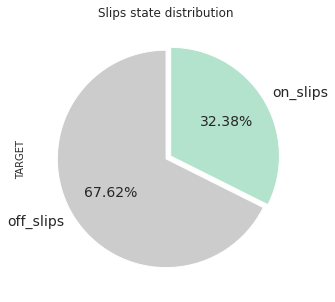

In [687]:
kwargs = dict(
    startangle = 90,
    colormap   = 'Pastel2_r',
    fontsize   = 14,
    figsize    = (40,5),
    explode    = (0, 0.05),
    autopct    = '%1.2f%%',
    title      = 'Slips state distribution'
)

data_df['TARGET'].value_counts().plot.pie(**kwargs)

**The dataset is imbalanced** and it can give some bias to the models. It's an attention point.


This dataset has a significant imbalance, that can generate bias for the models.
There are some alternatives to deal with imbalance classes, like using SMOTE to generate artificial data or removing some data as well, using Tomek Links just to give an example. It's a delicate situation because in real life the events happen in an imbalanced way.

**Classes over time**

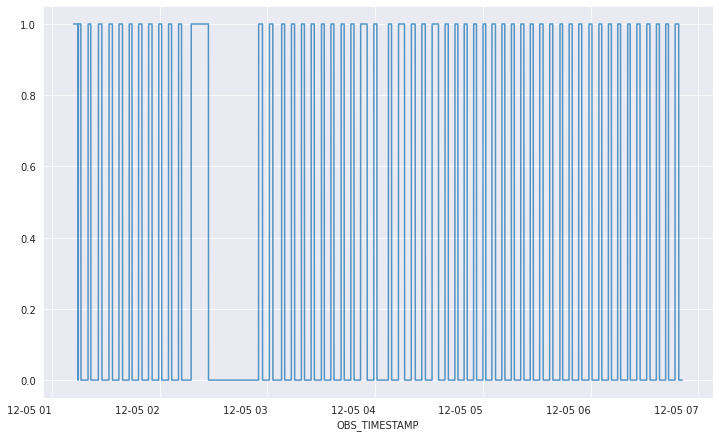

In [688]:
ax = data_df.plot(x="OBS_TIMESTAMP", y="ID_TARGET", legend=False, figsize=(12, 8), alpha=0.75, rot=0)

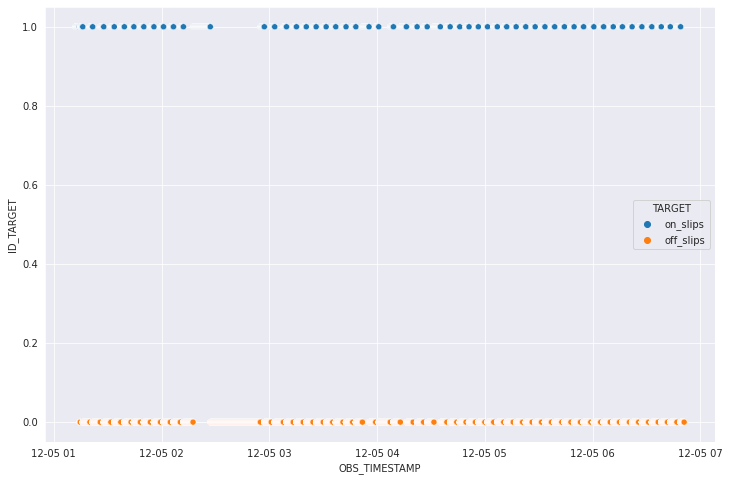

In [689]:
sns.scatterplot(x="OBS_TIMESTAMP", y="ID_TARGET", data=data_df, hue="TARGET")

💡 **Some insights**:

5. The class variation seems to be constant, except in two moments, which were:
 - before *12-05 03*, when the slips stayed off for more time, and
 - after *12-05 04*, when the slips stayed on for more time than usual

Something happened in these moments that generated these behaviors.

#### Features over time

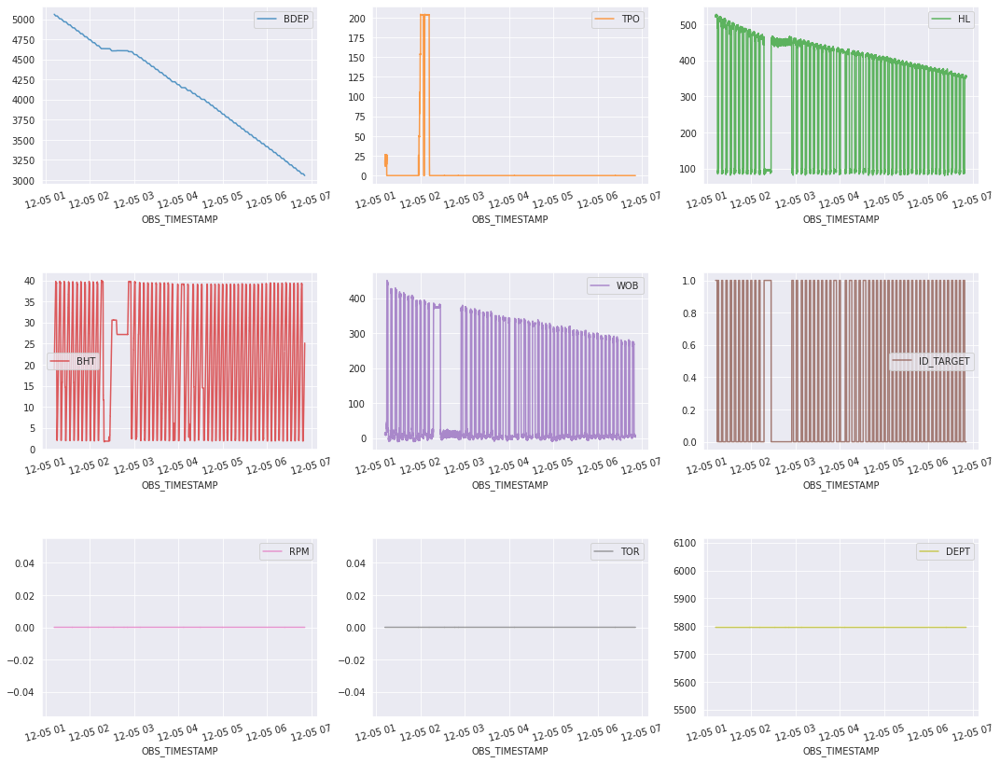

In [690]:
columns_plot = ['BDEP', 'TPO', 'HL', 'BHT', 'WOB', 'ID_TARGET', 'RPM', 'TOR', 'DEPT']
ax = data_df.plot(x='OBS_TIMESTAMP', y=columns_plot, subplots=True, layout=(3, 3), figsize=(18, 14), sharex=False, rot=15, alpha=0.75)
plt.subplots_adjust(hspace=0.5)
# plt.tight_layout()

💡 **Some insights:**

6. The `TOR`, `DEB`, and `RPM` columns are constant and because of that they are not important to determine the class, and can be disregarded.

7. The columns `HL` and `WOB` have opposite values over time and might help to determine the class. When the hook load increases the weight on the bit decreases and vice-versa.

8. The `TPO` column has observations above zero only for a short period before the moment 12-05 03. Considering that this feature represents fluid flow, it seems to be related to possible anomalies that happened afterward 









**The features over time considering the slips' state**

Analysis of the features `BDEP`, `TPO`, `HL`, `BHT`, and `WOB`

**BDEP**

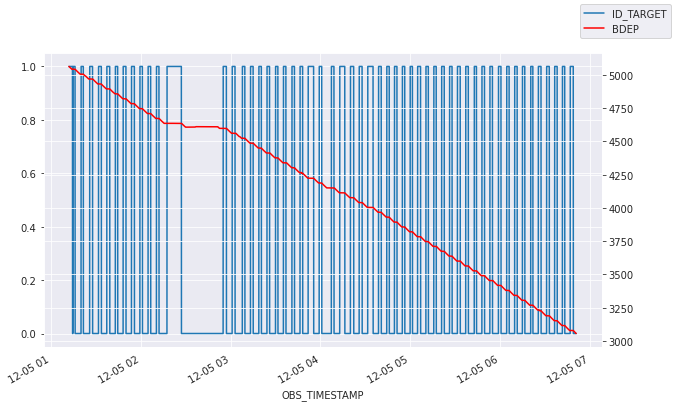

In [691]:
ax = data_df.plot(x="OBS_TIMESTAMP", y="ID_TARGET", legend=False)
ax2 = ax.twinx()
data_df.plot(x="OBS_TIMESTAMP", y="BDEP", ax=ax2, legend=False, color="r", figsize=(10, 6))
ax.figure.legend()
plt.show()

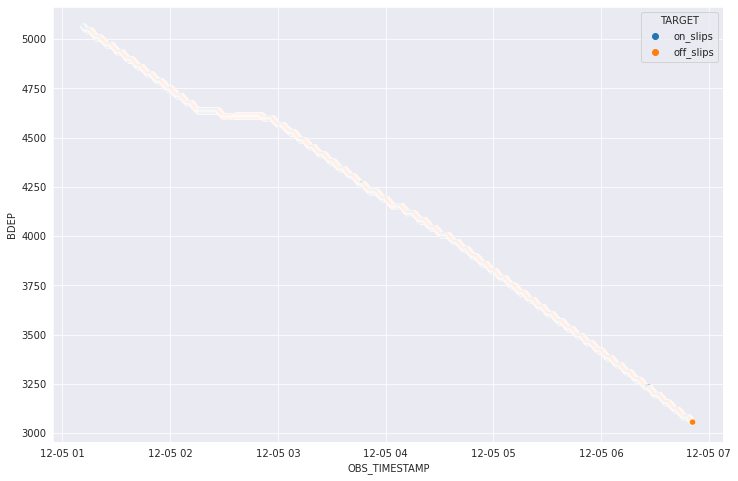

In [692]:
sns.scatterplot(x="OBS_TIMESTAMP", y="BDEP", data=data_df, hue="TARGET")

💡 **Some insights**:

9. Seems that when the slips are off, the `BDEP`decreases, but for some reason, during the pause moment, it stays with the same value. Considering that this feature represents the depth of the bit, if the slips are off and their value is decreasing, the possible assumption is that the bit is being removed from the hole.

**TPO**

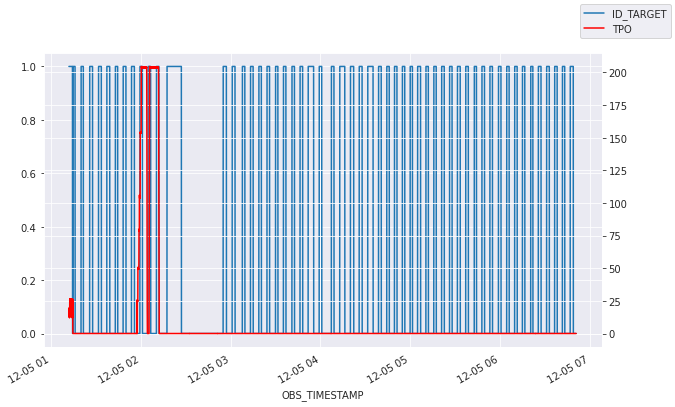

In [693]:
ax = data_df.plot(x="OBS_TIMESTAMP", y="ID_TARGET", legend=False)
ax2 = ax.twinx()
data_df.plot(x="OBS_TIMESTAMP", y="TPO", ax=ax2, legend=False, color="r", figsize=(10, 6))
ax.figure.legend()
plt.show()

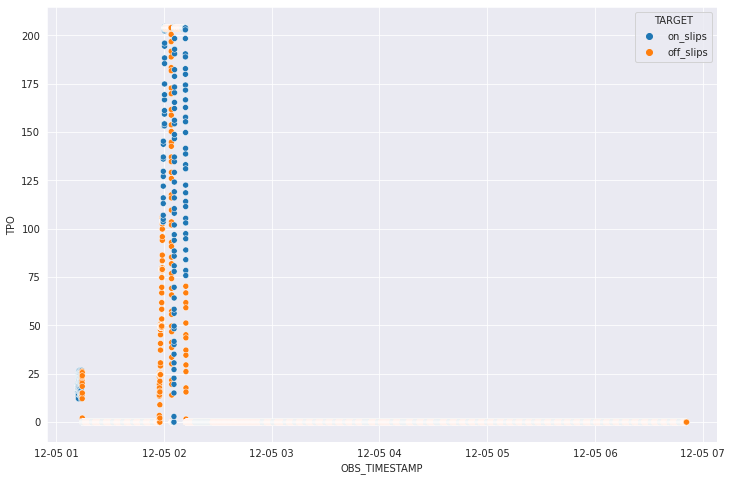

In [694]:
sns.scatterplot(x="OBS_TIMESTAMP", y="TPO", data=data_df, hue="TARGET")

💡 **Some insights**:

10. Looking at this plot, it's possible the detect that the fluid flow starts a few moments before the slips are turned off. Maybe the cause of this interruption in the tripping-out process is the fluid flow inside the well, possibly generated by some leaked incident. Excluding this incident, this feature stays in zero regardless of the slips' state and may not be useful for indicating the class.

**HL**

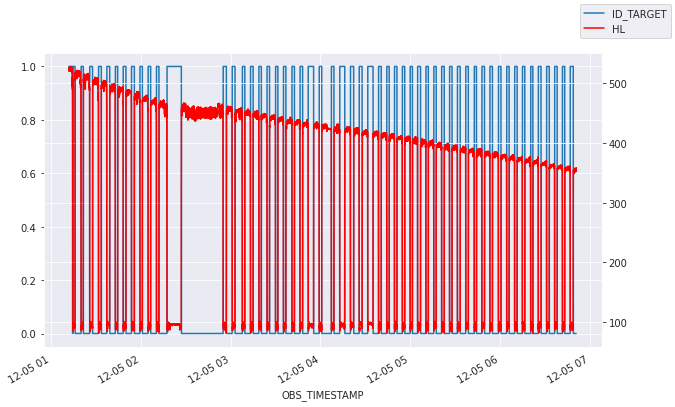

In [695]:
ax = data_df.plot(x="OBS_TIMESTAMP", y="ID_TARGET", legend=False)
ax2 = ax.twinx()
data_df.plot(x="OBS_TIMESTAMP", y="HL", ax=ax2, legend=False, color="r", figsize=(10, 6))
ax.figure.legend()
plt.show()

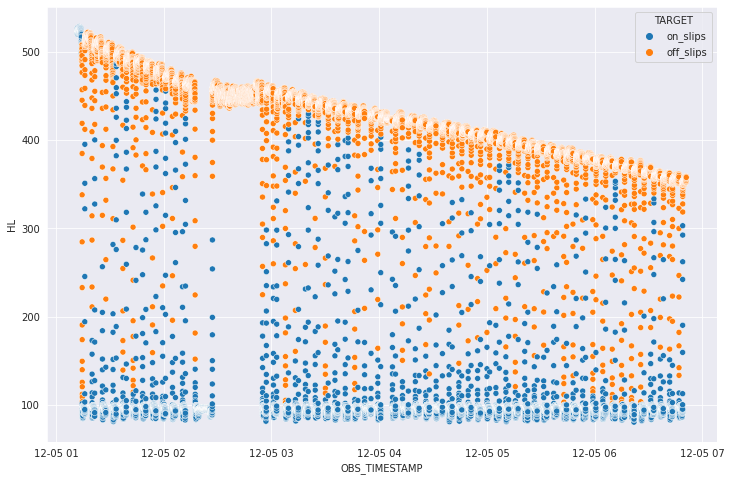

In [696]:
sns.scatterplot(x="OBS_TIMESTAMP", y="HL", data=data_df, hue="TARGET")

💡 **Some insights**:

11. Seems to be correlated to the target feature

**BHT**

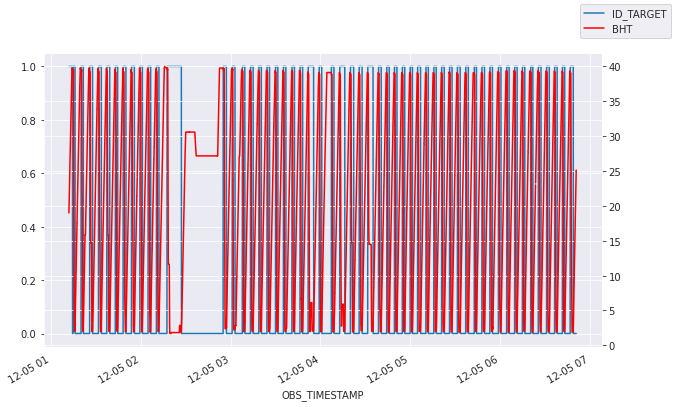

In [697]:
ax = data_df.plot(x="OBS_TIMESTAMP", y="ID_TARGET", legend=False)
ax2 = ax.twinx()
data_df.plot(x="OBS_TIMESTAMP", y="BHT", ax=ax2, legend=False, color="r", figsize=(10, 6))
ax.figure.legend()
plt.show()

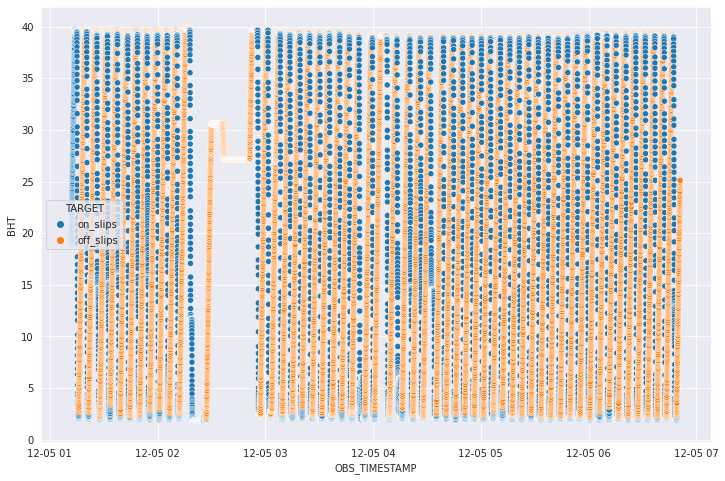

In [698]:
sns.scatterplot(x="OBS_TIMESTAMP", y="BHT", data=data_df, hue="TARGET")

💡 **Some insights**:

12. This feature seems to be correlated to the target feature.

**WOB**

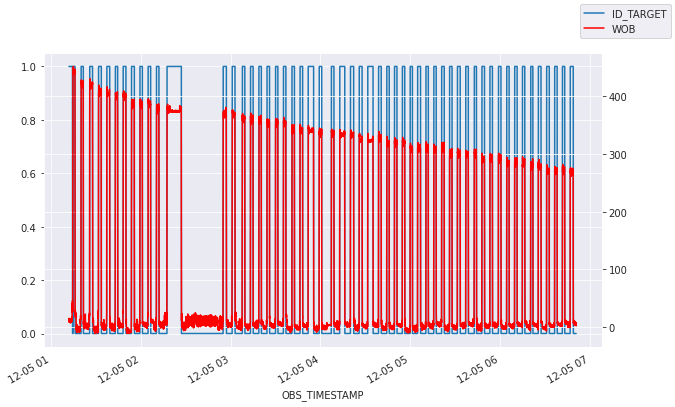

In [699]:
ax = data_df.plot(x="OBS_TIMESTAMP", y="ID_TARGET", legend=False)
ax2 = ax.twinx()
data_df.plot(x="OBS_TIMESTAMP", y="WOB", ax=ax2, legend=False, color="r", figsize=(10, 6))
ax.figure.legend()
plt.show()

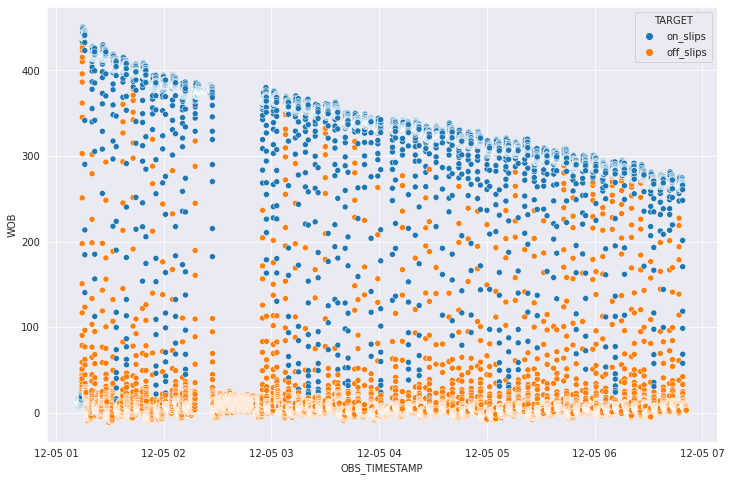

In [700]:
sns.scatterplot(x="OBS_TIMESTAMP", y="WOB", data=data_df, hue="TARGET")

💡 **Some insights**:

13. Seems to be correlated to the target feature

### Data frequency

**Features frequency over time**

Frequency of the features that can help to predict the state of the slips

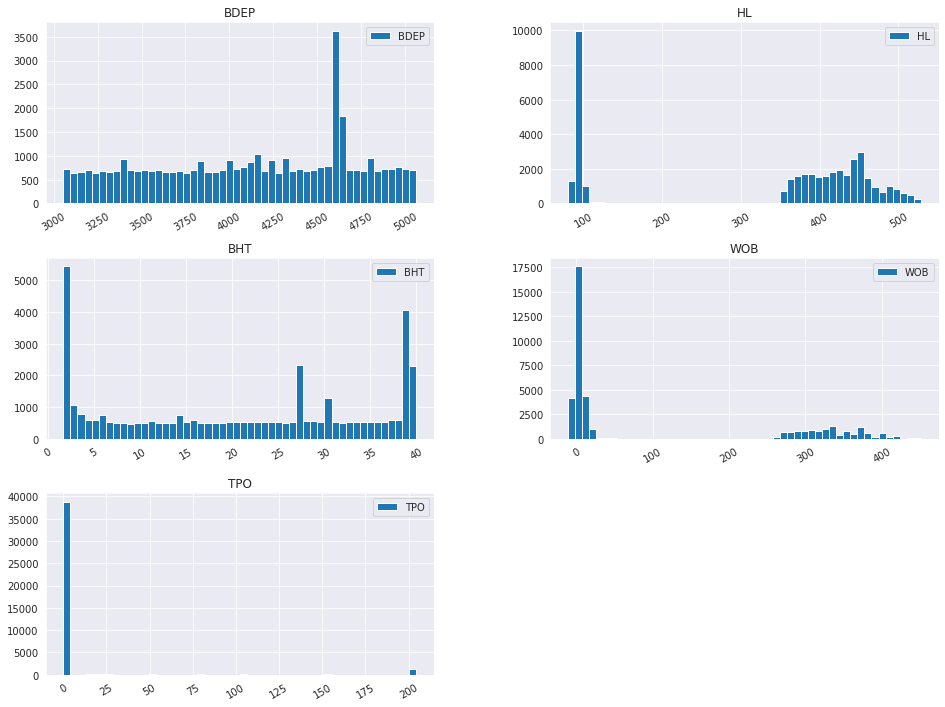

In [701]:
columns_plot = ['BDEP', 'HL', 'BHT', 'WOB', 'TPO']
hist_df = data_df[columns_plot]

hist_df.hist(figsize=(16,12), xrot=30, bins=50, legend=True)
plt.show()

💡 **Some insights:**

14. The features `BDEP` and `BHT`has values well distributed, with some peaks of occurrence.

15. The values of the feature `HL` has two defined groups, it seems to be a pattern, and few observations between these two groups, which can be noise during the measurement process





**Features frequency considering class**

In [702]:
hist_class_df = data_df.drop(columns={"RPM", "TOR", "DEPT", "OBS_TIMESTAMP", "TIMESTAMP", "ID_TARGET", "ID_ANNOTATION"})
hist_class_df.head()

,BDEP,TPO,HL,BHT,WOB,TARGET
0,5063.135,19.548731,522.503986,18.982,13.38,on_slips
1,5063.135,15.586150,523.159986,19.068,12.73,on_slips
2,5062.959,18.492043,524.441986,19.164,11.45,on_slips
3,5062.959,16.114494,525.053986,19.249,10.84,on_slips
4,5062.778,17.699526,526.081986,19.347,9.81,on_slips


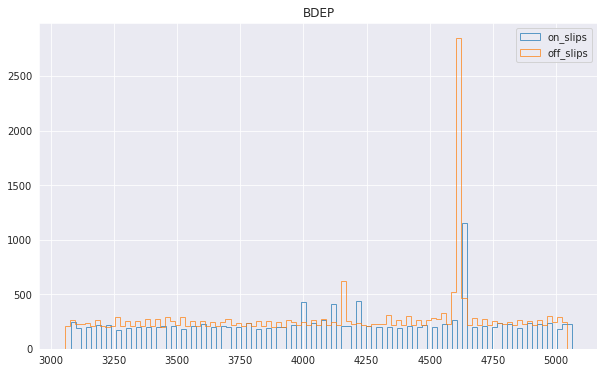

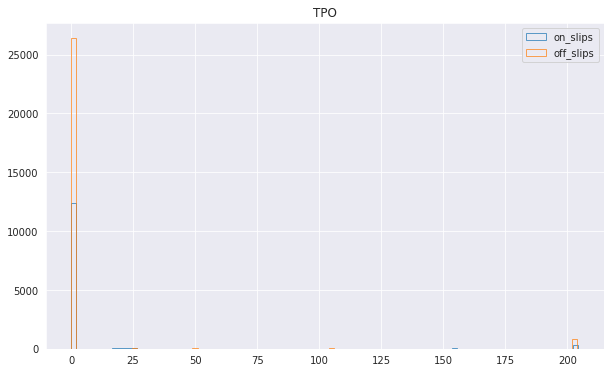

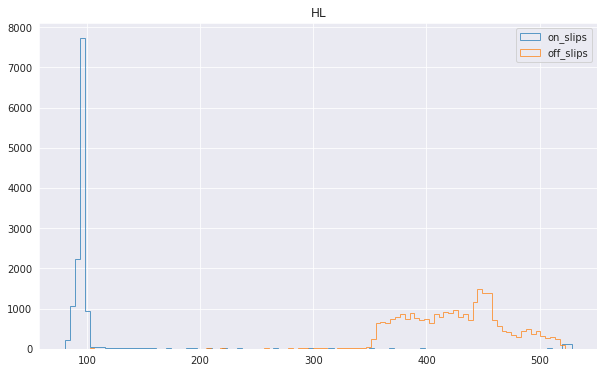

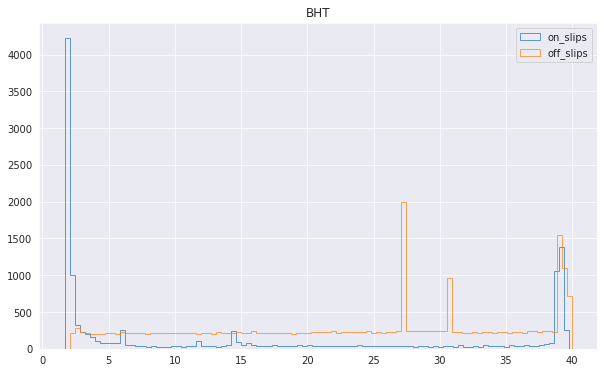

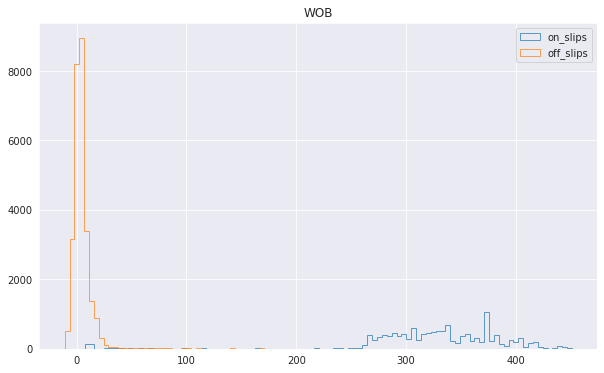

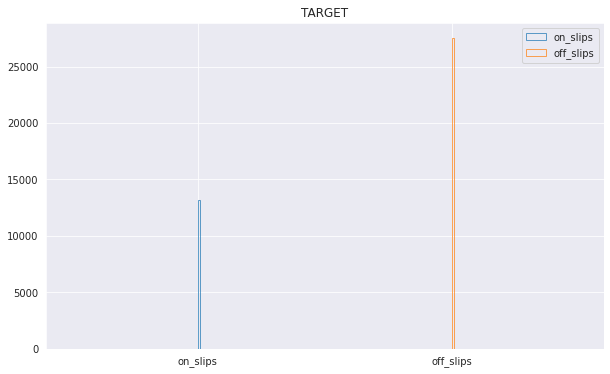

In [703]:
for i in hist_class_df.columns:
    plt.figure(figsize=(10,6))
    tmp1 = data_df[data_df["TARGET"] == "on_slips"]
    tmp2 = data_df[data_df["TARGET"] == "off_slips"]
    # plt.hist(tmp1[i], bins=50, alpha=0.5, label="on_slips")
    # plt.hist(tmp2[i], bins=50, alpha=0.5, label="off_slips")
    plt.hist(tmp1[i], bins=100, alpha=0.7, label="on_slips", histtype="step")
    plt.hist(tmp2[i], bins=100, alpha=0.7, label="off_slips", histtype="step")
    plt.title(i)
    plt.legend(loc="upper right")

💡 **Some insights:**

16. The features `HL` and `WOB`have two defined groups by class and it can help in the models' construction





### **Summary statistics**

In [704]:
data_df.head()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET
0,1.607131e+12,5063.135,19.548731,522.503986,18.982,0.0,0.0,5795.817,13.38,2020-12-05 01:12:00.314,on_slips,-1,1
1,1.607131e+12,5063.135,15.586150,523.159986,19.068,0.0,0.0,5795.817,12.73,2020-12-05 01:12:00.822,on_slips,-1,1
2,1.607131e+12,5062.959,18.492043,524.441986,19.164,0.0,0.0,5795.817,11.45,2020-12-05 01:12:01.329,on_slips,-1,1
3,1.607131e+12,5062.959,16.114494,525.053986,19.249,0.0,0.0,5795.817,10.84,2020-12-05 01:12:01.838,on_slips,-1,1
4,1.607131e+12,5062.778,17.699526,526.081986,19.347,0.0,0.0,5795.817,9.81,2020-12-05 01:12:02.346,on_slips,-1,1


In [705]:
stats_def = data_df.drop(columns={"TIMESTAMP", "OBS_TIMESTAMP", "ID_TARGET", "ID_ANNOTATION"})
stats_def.describe()

,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB
count,40673.000000,40660.000000,40671.000000,40658.000000,40647.0,40656.0,40651.000,40651.000000
mean,4128.110895,6.970594,322.494967,20.995525,0.0,0.0,5795.817,109.278085
std,566.009203,35.477067,157.447630,13.364818,0.0,0.0,0.000,155.015235
min,3055.281000,0.000000,80.455998,1.694000,0.0,0.0,5795.817,-10.760000
25%,3636.986000,0.000000,97.413997,7.635000,0.0,0.0,5795.817,1.760000
50%,4179.829000,0.000000,394.129990,22.199000,0.0,0.0,5795.817,6.600000
75%,4610.241000,0.000000,445.305988,33.103250,0.0,0.0,5795.817,293.090000
max,5063.135000,204.469157,528.517986,39.987000,0.0,0.0,5795.817,451.030000


💡 **Some insights:**

17. The columns `RPM`, `TOR`, and `DEPT` won't be considered in the model, because they always have the same value for all the observations  

18. Looking at the `count` measure, we can identify features with missing data because their count is not equal to the total of rows.

19. Looking at the `min` and `max` measures we can see that:
    *   `TPO`, `HL`, `BHT`, and `WOB` have their values in an interval with very distant extremes
    *   `WOB` has a negative number as a minimum value, and since this characteristic is related to the **weight of the bit**, it would be necessary to confirm with an expert in the context if this negative measurement makes any sense because at first, it seems wrong to have a negative weight.





### Relationships between features

In [706]:
data_df.head()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET
0,1.607131e+12,5063.135,19.548731,522.503986,18.982,0.0,0.0,5795.817,13.38,2020-12-05 01:12:00.314,on_slips,-1,1
1,1.607131e+12,5063.135,15.586150,523.159986,19.068,0.0,0.0,5795.817,12.73,2020-12-05 01:12:00.822,on_slips,-1,1
2,1.607131e+12,5062.959,18.492043,524.441986,19.164,0.0,0.0,5795.817,11.45,2020-12-05 01:12:01.329,on_slips,-1,1
3,1.607131e+12,5062.959,16.114494,525.053986,19.249,0.0,0.0,5795.817,10.84,2020-12-05 01:12:01.838,on_slips,-1,1
4,1.607131e+12,5062.778,17.699526,526.081986,19.347,0.0,0.0,5795.817,9.81,2020-12-05 01:12:02.346,on_slips,-1,1


**Pairplot**

Plotting the relationships between the variables

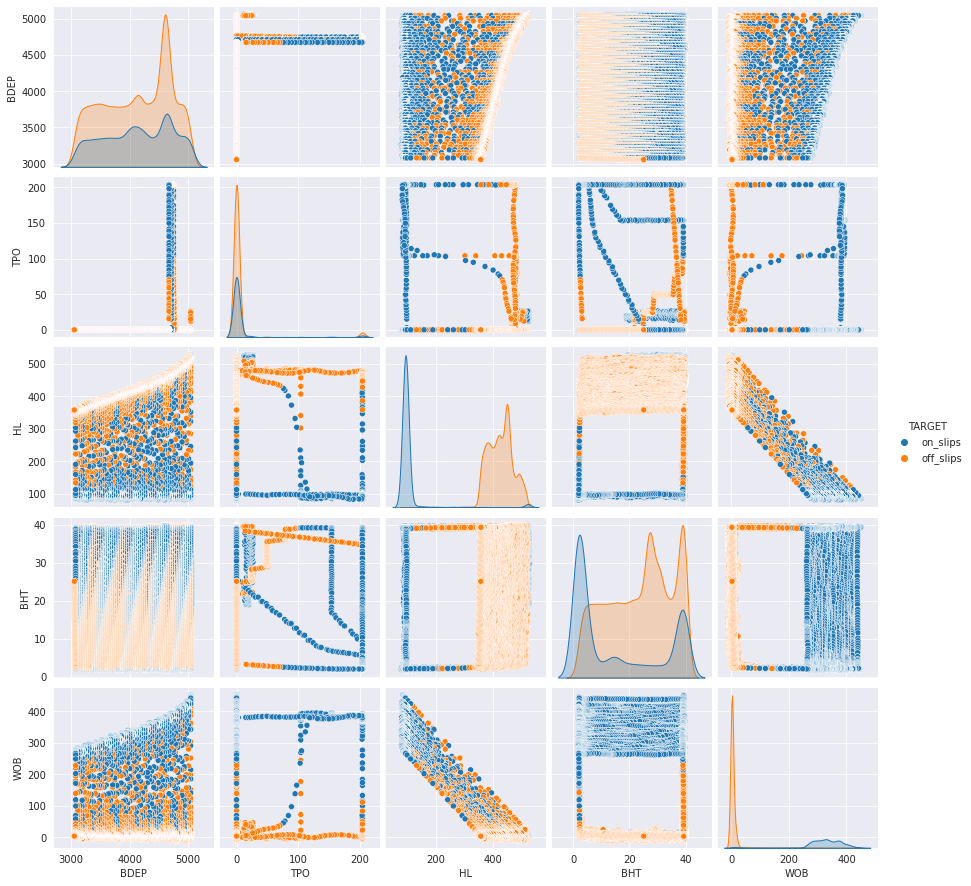

In [707]:
pairplot_columns=['BDEP', 'TPO', 'HL', 'BHT', 'WOB', 'OBS_TIMESTAMP', 'TARGET']
sns.pairplot(data_df[pairplot_columns], hue='TARGET')

Relationship between `WOB` and `HL`, that had shown on the line plot opposite behavior

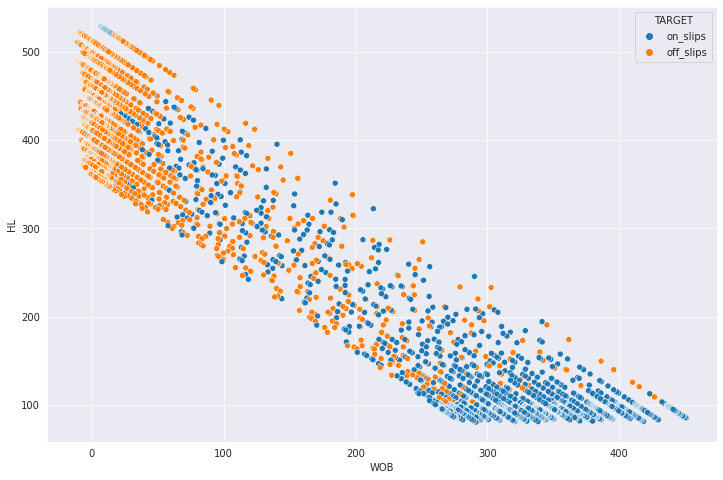

In [708]:
sns.scatterplot(x="WOB", y="HL", data=data_df, hue="TARGET")

**Correlation**

Let's see the correlation between each feature in the dataset.

In [709]:
corrs_def = data_df.drop(columns={"TIMESTAMP", "ID_ANNOTATION"})
corrs = corrs_def.corr()
corrs

,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,ID_TARGET
BDEP,1.000000,0.204279,0.203356,0.035121,NaN,NaN,NaN,0.066479,0.005621
TPO,0.204279,1.000000,0.035313,-0.009674,NaN,NaN,NaN,0.021866,0.012140
HL,0.203356,0.035313,1.000000,0.290438,NaN,NaN,NaN,-0.962229,-0.935169
BHT,0.035121,-0.009674,0.290438,1.000000,NaN,NaN,NaN,-0.285250,-0.292218
RPM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TOR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DEPT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WOB,0.066479,0.021866,-0.962229,-0.285250,NaN,NaN,NaN,1.000000,0.957739
ID_TARGET,0.005621,0.012140,-0.935169,-0.292218,NaN,NaN,NaN,0.957739,1.000000


For better visualization, let's plot a heatmap of these correlations

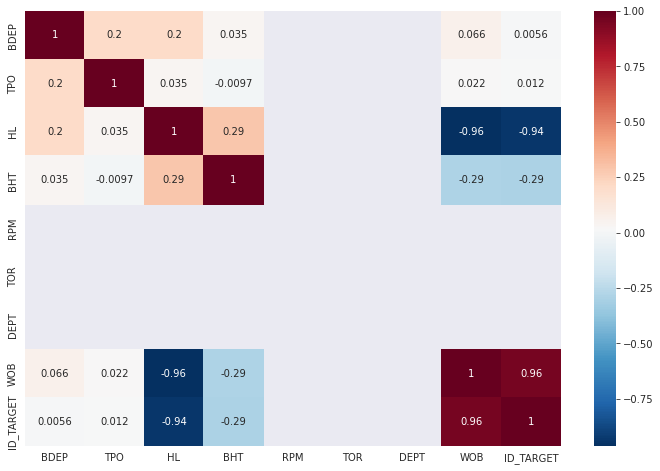

In [710]:
pd.set_option('display.max_columns', 100)
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
sns.heatmap(corrs, cmap="RdBu_r",annot=True)

As can be seen above, the constant columns don't correlate to anyone.

Now let's see the correlations using only selected features

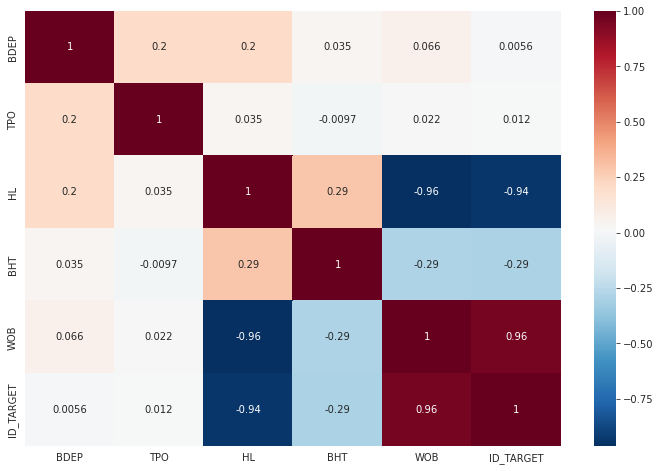

In [711]:
corrs_def.drop(columns={"RPM", "TOR", "DEPT"}, inplace=True)
corrs = corrs_def.corr()
pd.set_option('display.max_columns', 100)
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
sns.heatmap(corrs, cmap="RdBu_r",annot=True)

💡 **Some insights:**

20. About the correlation relationships:

    - `HL` has a strong negative correlation with the class (ID_TARGET)
    - `WOB` has a strong positive correlation with the class (ID_TARGET)
    - Although, in the correlation matrix these same columns have a strong correlation with each other, which can bring some errors to the prediction model
    - `BDEP` and `TPO` don't have relevant correlations with anybody and they are candidates to be removed from de data

### Searching for outliers

Outliers are extreme values in the dataset, that can be very large or very small, beeing distant from the majority ones. Before remove the outliers, it's necessary to understand if they make sense or not, in order to don't modify the natural context of the data.

In [712]:
# outlier_df = data_df.drop(columns={'TIMESTAMP', 'BDEP', 'TPO', 'RPM', 'TOR', 'DEPT', 'OBS_TIMESTAMP', 'TARGET', 'ID_ANNOTATION', 'ID_TARGET'})
outlier_df = data_df.drop(columns={'TIMESTAMP', 'RPM', 'TOR', 'DEPT', 'OBS_TIMESTAMP', 'TARGET', 'ID_ANNOTATION', 'ID_TARGET'})
outlier_df.head()

,BDEP,TPO,HL,BHT,WOB
0,5063.135,19.548731,522.503986,18.982,13.38
1,5063.135,15.586150,523.159986,19.068,12.73
2,5062.959,18.492043,524.441986,19.164,11.45
3,5062.959,16.114494,525.053986,19.249,10.84
4,5062.778,17.699526,526.081986,19.347,9.81


**Calculating the IQR for each column**

In [713]:
def outliersLimits(column):
    Q1 = column.quantile(q = 0.25)
    Q2 = column.quantile(q = 0.50) # median
    Q3 = column.quantile(q = 0.75)
    Q4 = column.quantile(q = 1.00) # max
    print('Q1: ', Q1)
    print('Q2: ', Q2)
    print('Q3: ', Q3)
    print('Q4: ', Q4)

    IQR = Q3 - Q1
    print('IQR: ', IQR)

    lower_limit = Q1 - 1.5 * IQR
    higher_limit = Q3 + 1.5 * IQR
    print('Inferior limit:', lower_limit, 'Superior limit:', higher_limit)

for column in outlier_df:
    print('\n',column)
    outlier_df = outlier_df.sort_values(by=column)
    outliersLimits(outlier_df[column])


 BDEP
Q1:  3636.986
Q2:  4179.829
Q3:  4610.241
Q4:  5063.135
IQR:  973.2550000000001
Inferior limit: 2177.1034999999997 Superior limit: 6070.1235

 TPO
Q1:  0.0
Q2:  0.0
Q3:  0.0
Q4:  204.4691568579589
IQR:  0.0
Inferior limit: 0.0 Superior limit: 0.0

 HL
Q1:  97.41399747584823
Q2:  394.1299897874646
Q3:  445.30598846141294
Q4:  528.5179863052578
IQR:  347.8919909855647
Inferior limit: -424.4239890024988 Superior limit: 967.14397493976

 BHT
Q1:  7.635
Q2:  22.198999999999998
Q3:  33.10325
Q4:  39.987
IQR:  25.468250000000005
Inferior limit: -30.567375000000006 Superior limit: 71.305625

 WOB
Q1:  1.76
Q2:  6.6
Q3:  293.09000000000003
Q4:  451.03
IQR:  291.33000000000004
Inferior limit: -435.23500000000007 Superior limit: 730.085


**Boxplots**

In [714]:
outlier_df['TARGET'] = data_df['TARGET']
outlier_df

,BDEP,TPO,HL,BHT,WOB,TARGET
2080,4952.022,0.0,510.585987,18.893,-10.76,off_slips
2081,4952.022,0.0,510.525987,18.981,-10.70,off_slips
4680,4810.499,0.0,489.143987,12.476,-10.32,off_slips
4714,4807.340,0.0,489.037987,15.645,-10.21,off_slips
4697,4808.781,0.0,488.999987,14.112,-10.17,off_slips
...,...,...,...,...,...,...
9655,4606.822,NaN,447.383988,NaN,NaN,off_slips
5476,4761.827,0.0,482.213988,NaN,NaN,off_slips
5475,4761.827,0.0,483.163987,NaN,NaN,off_slips
11915,4610.241,NaN,NaN,NaN,NaN,off_slips


**Generating  boxplots for each column to see possible outliers**

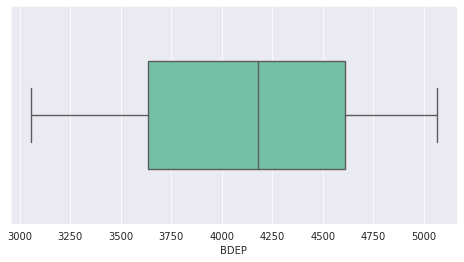

In [715]:
plt.figure(figsize=(8,4))
sns.boxplot(data=outlier_df, x='BDEP', color='mediumaquamarine', width=.5, linewidth=1.4)

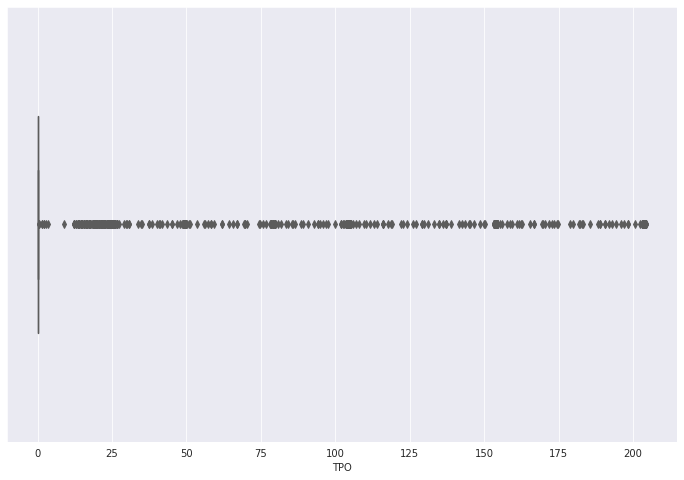

In [716]:
sns.boxplot(data=outlier_df, x='TPO', color='mediumaquamarine', width=.5, linewidth=1.4)

💡 **Some insights:**

21. This feature has a large number of outliers and may not help to predict the class

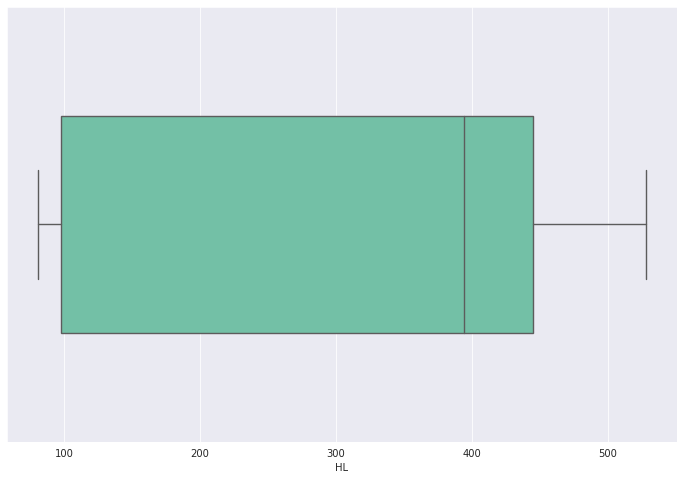

In [717]:
sns.boxplot(data=outlier_df, x='HL', color='mediumaquamarine', width=.5, linewidth=1.4)

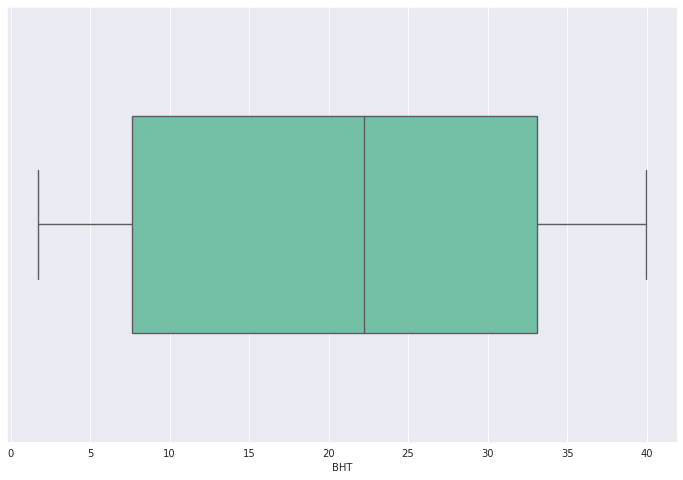

In [718]:
sns.boxplot(data=outlier_df, x='BHT', color='mediumaquamarine', width=.5, linewidth=1.4)

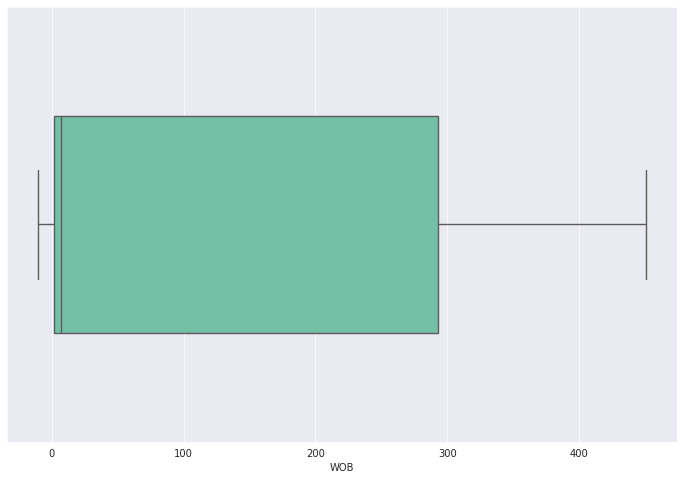

In [719]:
sns.boxplot(data=outlier_df, x='WOB', color='mediumaquamarine', width=.5, linewidth=1.4)

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



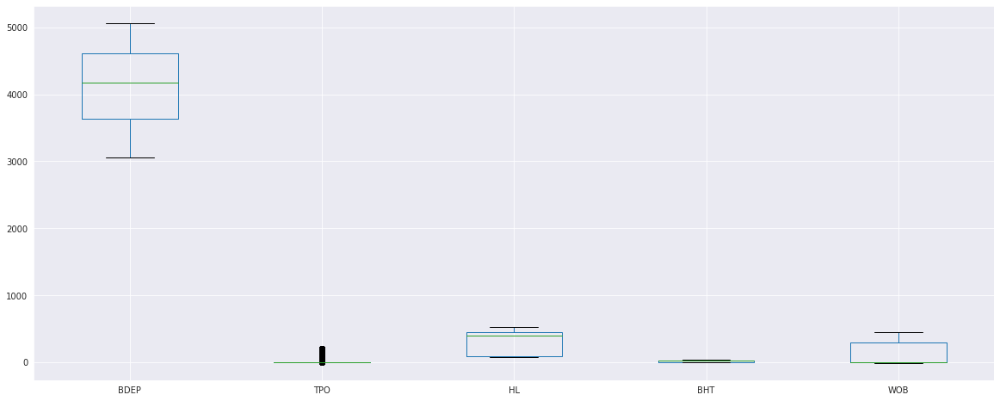

In [720]:
outlier_df.boxplot(figsize=(20, 8))

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' wh

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f4043e951f0>,
      dtype=object)

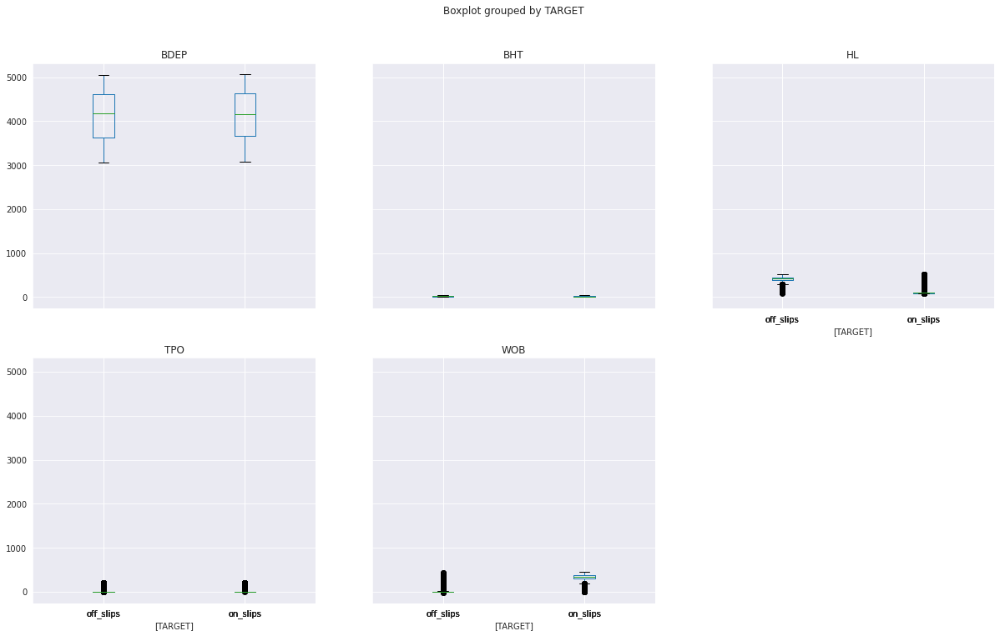

In [721]:
outlier_df.boxplot(by='TARGET', figsize=(20, 12), layout=(2,3))

### Exploring time features

**For how long were these measurements collected?**

In [722]:
t0 = data_df.OBS_TIMESTAMP.loc[0]
t_last = data_df.OBS_TIMESTAMP.loc[len(data_df)-1]
print('Date of the first measure: ', t0)
print('Date of the last measure: ', t_last)

Date of the first measure:  2020-12-05 01:12:00.314000
Date of the last measure:  2020-12-05 06:50:59.636000


In [723]:
print('Duration: ', t_last - t0)

Duration:  0 days 05:38:59.322000


The timestamps are valid and the measures are from the same day in an interval of **5hs 38 minutes and 59 seconds**



**What was the time between the measures?**

Getting the time of the previous measure

In [724]:
test_df = data_df.copy()
test_df['PREVIOUS_TIME'] = test_df['OBS_TIMESTAMP'].shift()
test_df.head()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET,PREVIOUS_TIME
0,1.607131e+12,5063.135,19.548731,522.503986,18.982,0.0,0.0,5795.817,13.38,2020-12-05 01:12:00.314,on_slips,-1,1,NaT
1,1.607131e+12,5063.135,15.586150,523.159986,19.068,0.0,0.0,5795.817,12.73,2020-12-05 01:12:00.822,on_slips,-1,1,2020-12-05 01:12:00.314
2,1.607131e+12,5062.959,18.492043,524.441986,19.164,0.0,0.0,5795.817,11.45,2020-12-05 01:12:01.329,on_slips,-1,1,2020-12-05 01:12:00.822
3,1.607131e+12,5062.959,16.114494,525.053986,19.249,0.0,0.0,5795.817,10.84,2020-12-05 01:12:01.838,on_slips,-1,1,2020-12-05 01:12:01.329
4,1.607131e+12,5062.778,17.699526,526.081986,19.347,0.0,0.0,5795.817,9.81,2020-12-05 01:12:02.346,on_slips,-1,1,2020-12-05 01:12:01.838


Removing first row as it will not have previous value

In [725]:
test_df = test_df.tail(-1)
test_df.head()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET,PREVIOUS_TIME
1,1.607131e+12,5063.135,15.586150,523.159986,19.068,0.0,0.0,5795.817,12.73,2020-12-05 01:12:00.822,on_slips,-1,1,2020-12-05 01:12:00.314
2,1.607131e+12,5062.959,18.492043,524.441986,19.164,0.0,0.0,5795.817,11.45,2020-12-05 01:12:01.329,on_slips,-1,1,2020-12-05 01:12:00.822
3,1.607131e+12,5062.959,16.114494,525.053986,19.249,0.0,0.0,5795.817,10.84,2020-12-05 01:12:01.838,on_slips,-1,1,2020-12-05 01:12:01.329
4,1.607131e+12,5062.778,17.699526,526.081986,19.347,0.0,0.0,5795.817,9.81,2020-12-05 01:12:02.346,on_slips,-1,1,2020-12-05 01:12:01.838
5,1.607131e+12,5062.778,17.699526,526.521986,19.347,0.0,0.0,5795.817,9.37,2020-12-05 01:12:02.853,on_slips,-1,1,2020-12-05 01:12:02.346


Finding the timedelta for each observation

In [726]:
test_df['DURATION'] = test_df.OBS_TIMESTAMP - test_df.PREVIOUS_TIME
test_df.head()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET,PREVIOUS_TIME,DURATION
1,1.607131e+12,5063.135,15.586150,523.159986,19.068,0.0,0.0,5795.817,12.73,2020-12-05 01:12:00.822,on_slips,-1,1,2020-12-05 01:12:00.314,0 days 00:00:00.508000
2,1.607131e+12,5062.959,18.492043,524.441986,19.164,0.0,0.0,5795.817,11.45,2020-12-05 01:12:01.329,on_slips,-1,1,2020-12-05 01:12:00.822,0 days 00:00:00.507000
3,1.607131e+12,5062.959,16.114494,525.053986,19.249,0.0,0.0,5795.817,10.84,2020-12-05 01:12:01.838,on_slips,-1,1,2020-12-05 01:12:01.329,0 days 00:00:00.509000
4,1.607131e+12,5062.778,17.699526,526.081986,19.347,0.0,0.0,5795.817,9.81,2020-12-05 01:12:02.346,on_slips,-1,1,2020-12-05 01:12:01.838,0 days 00:00:00.508000
5,1.607131e+12,5062.778,17.699526,526.521986,19.347,0.0,0.0,5795.817,9.37,2020-12-05 01:12:02.853,on_slips,-1,1,2020-12-05 01:12:02.346,0 days 00:00:00.507000


Generating the duration in seconds

In [727]:
# test_df['DURATION_MIN'] = test_df['DURATION'] / np.timedelta64(1, 'm')
test_df['DURATION_SEC'] = test_df['DURATION'] / np.timedelta64(1, 's')
test_df.tail()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET,PREVIOUS_TIME,DURATION,DURATION_SEC
40668,1.607151e+12,3055.453,0.0,358.541991,24.768,0.0,0.0,5795.817,2.46,2020-12-05 06:50:57.604,off_slips,108,0,2020-12-05 06:50:57.096,0 days 00:00:00.508000,0.508
40669,1.607151e+12,3055.453,0.0,358.595991,24.856,0.0,0.0,5795.817,2.40,2020-12-05 06:50:58.112,off_slips,108,0,2020-12-05 06:50:57.604,0 days 00:00:00.508000,0.508
40670,1.607151e+12,3055.453,0.0,358.605991,24.940,0.0,0.0,5795.817,2.39,2020-12-05 06:50:58.620,off_slips,108,0,2020-12-05 06:50:58.112,0 days 00:00:00.508000,0.508
40671,1.607151e+12,3055.281,0.0,358.411991,25.038,0.0,0.0,5795.817,2.59,2020-12-05 06:50:59.128,off_slips,108,0,2020-12-05 06:50:58.620,0 days 00:00:00.508000,0.508
40672,1.607151e+12,3055.281,0.0,357.757991,25.123,0.0,0.0,5795.817,3.24,2020-12-05 06:50:59.636,off_slips,108,0,2020-12-05 06:50:59.128,0 days 00:00:00.508000,0.508


Seeing the stats of duration

In [728]:
test_df[["DURATION","DURATION_SEC"]].describe()

,DURATION,DURATION_SEC
count,40672,40672.000000
mean,0 days 00:00:00.500081677,0.500082
std,0 days 00:00:00.034306572,0.034307
min,0 days 00:00:00.003000,0.003000
25%,0 days 00:00:00.507000,0.507000
50%,0 days 00:00:00.508000,0.508000
75%,0 days 00:00:00.508000,0.508000
max,0 days 00:00:02.846000,2.846000


Plotting the durations of the observations 

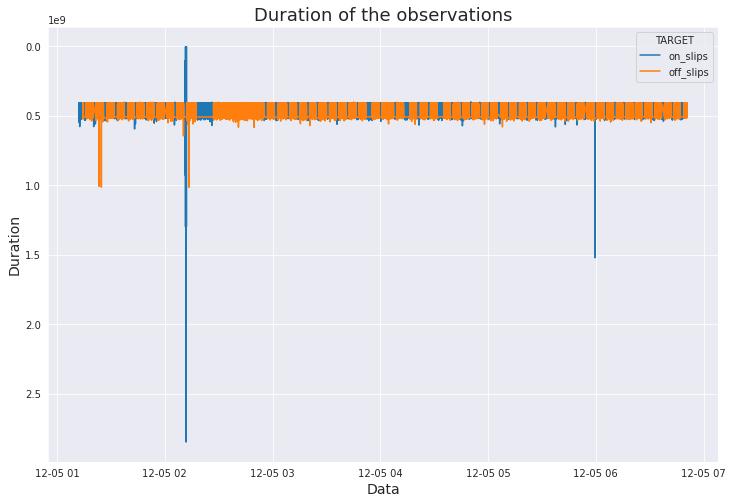

In [729]:
def gererateLinePlot(data, x, y, hue, title, xlabel, ylabel):
    plt.figure(figsize=(12,8))
    fig = sns.lineplot(x=x, y=y, hue=hue, data=data)
    fig.set_title(title, loc='center', fontsize=18)
    fig.set_xlabel(xlabel, fontsize=14)
    fig.set_ylabel(ylabel, fontsize=14)

gererateLinePlot(test_df, 'OBS_TIMESTAMP', 'DURATION', 'TARGET', 'Duration of the observations', 'Data', 'Duration')

In the challenge description, it's said that "***We expect that the data has a sample rate of 2 samples per second***".

Looking at the plot above and the stats of observations duration, we see that the duration tends to be 0.5 seconds, so 2 samples per second, confirming the information given in the description.

**What was the time between every state change?**

Calculating the datetime for the next annotation

In [730]:
aux_annotation_df = annotation_df.copy()
aux_annotation_df['NEXT_ANNOTATION'] = aux_annotation_df['OBS_TIMESTAMP'].shift(-1)
aux_annotation_df.head()

,TIMESTAMP,Annotation,OBS_TIMESTAMP,NEXT_ANNOTATION
0,1.607131e+12,off_slips,2020-12-05 01:14:22,2020-12-05 01:14:40
1,1.607131e+12,on_slips,2020-12-05 01:14:40,2020-12-05 01:16:06
2,1.607131e+12,off_slips,2020-12-05 01:16:06,2020-12-05 01:20:06
3,1.607131e+12,on_slips,2020-12-05 01:20:06,2020-12-05 01:21:37
4,1.607131e+12,off_slips,2020-12-05 01:21:37,2020-12-05 01:25:51


Removing last row as it will not have previous value

In [731]:
aux_annotation_df = aux_annotation_df.head(-1)

Calculating the duration of each annotation

In [732]:
aux_annotation_df['TIME_IN_STATE'] = aux_annotation_df.NEXT_ANNOTATION - aux_annotation_df.OBS_TIMESTAMP
aux_annotation_df.head()

,TIMESTAMP,Annotation,OBS_TIMESTAMP,NEXT_ANNOTATION,TIME_IN_STATE
0,1.607131e+12,off_slips,2020-12-05 01:14:22,2020-12-05 01:14:40,0 days 00:00:18
1,1.607131e+12,on_slips,2020-12-05 01:14:40,2020-12-05 01:16:06,0 days 00:01:26
2,1.607131e+12,off_slips,2020-12-05 01:16:06,2020-12-05 01:20:06,0 days 00:04:00
3,1.607131e+12,on_slips,2020-12-05 01:20:06,2020-12-05 01:21:37,0 days 00:01:31
4,1.607131e+12,off_slips,2020-12-05 01:21:37,2020-12-05 01:25:51,0 days 00:04:14


In [733]:
aux_annotation_df.describe()

,TIMESTAMP,TIME_IN_STATE
count,1.080000e+02,108
mean,1.607141e+12,0 days 00:03:05.925925925
std,6.012737e+06,0 days 00:02:44.024941327
min,1.607131e+12,0 days 00:00:18
25%,1.607137e+12,0 days 00:01:42.750000
50%,1.607142e+12,0 days 00:03:29
75%,1.607146e+12,0 days 00:03:41.250000
max,1.607151e+12,0 days 00:27:55


Calculating stats for each class

In [734]:
aux_annotation_df.groupby('Annotation')['TIME_IN_STATE'].describe()

,count,mean,std,min,25%,50%,75%,max
Annotation,,,,,,,,
off_slips,54,0 days 00:04:12.481481481,0 days 00:03:21.355663998,0 days 00:00:18,0 days 00:03:37.250000,0 days 00:03:41,0 days 00:03:50.750000,0 days 00:27:55
on_slips,54,0 days 00:01:59.370370370,0 days 00:01:08.887191431,0 days 00:01:26,0 days 00:01:40,0 days 00:01:43.500000,0 days 00:01:53.750000,0 days 00:09:37


The average time spent in the **off_slips** state is **4 minutes and 12 seconds**.<br>

The average time spent in the **on_slips** state is **1 minute and 59 seconds**.




Through the stats, it's possible to see that there are two main intervals with an anomaly, being the max value of each class.

Converting the time in each state to minutes, to be easier to understand and also visualize

In [735]:
aux_annotation_df['TIME_IN_STATE_SIMPLIFIED'] = aux_annotation_df['TIME_IN_STATE'] / np.timedelta64(1, 'm')
aux_annotation_df.head()

,TIMESTAMP,Annotation,OBS_TIMESTAMP,NEXT_ANNOTATION,TIME_IN_STATE,TIME_IN_STATE_SIMPLIFIED
0,1.607131e+12,off_slips,2020-12-05 01:14:22,2020-12-05 01:14:40,0 days 00:00:18,0.300000
1,1.607131e+12,on_slips,2020-12-05 01:14:40,2020-12-05 01:16:06,0 days 00:01:26,1.433333
2,1.607131e+12,off_slips,2020-12-05 01:16:06,2020-12-05 01:20:06,0 days 00:04:00,4.000000
3,1.607131e+12,on_slips,2020-12-05 01:20:06,2020-12-05 01:21:37,0 days 00:01:31,1.516667
4,1.607131e+12,off_slips,2020-12-05 01:21:37,2020-12-05 01:25:51,0 days 00:04:14,4.233333


[]

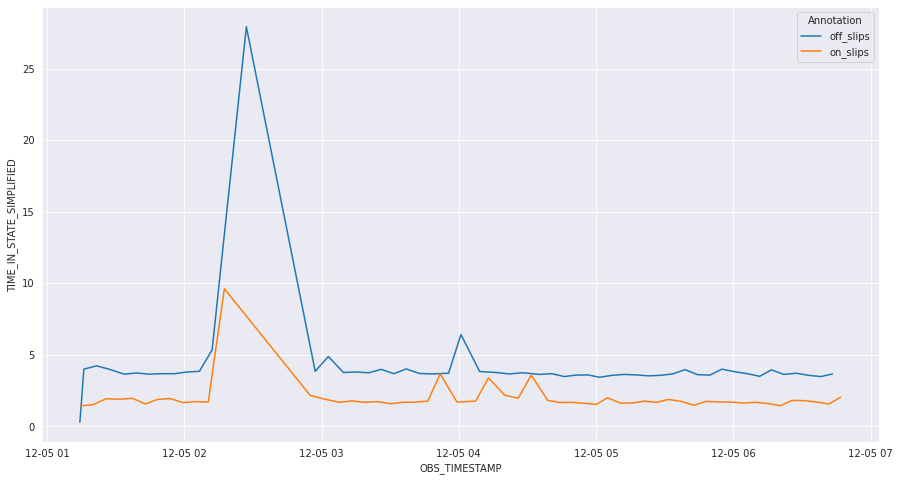

In [736]:
plt.figure(figsize=(15,8))
sns.lineplot(x='OBS_TIMESTAMP', y='TIME_IN_STATE_SIMPLIFIED', data=aux_annotation_df, hue='Annotation')
plt.plot()

Disregarding the period in which there was an abnormal behavior in the base, the time series doesn't appear at the first moment having an expressive variation for each class.

The first hypothesis here was that the time may not be not so influential in the slips’ state

# Part II: Preprocessing

Let's create a new dataframe from the original one to manipulate their data

In [737]:
preprocessed_data_df = data_df.copy()
preprocessed_data_df.head()

,TIMESTAMP,BDEP,TPO,HL,BHT,RPM,TOR,DEPT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET
0,1.607131e+12,5063.135,19.548731,522.503986,18.982,0.0,0.0,5795.817,13.38,2020-12-05 01:12:00.314,on_slips,-1,1
1,1.607131e+12,5063.135,15.586150,523.159986,19.068,0.0,0.0,5795.817,12.73,2020-12-05 01:12:00.822,on_slips,-1,1
2,1.607131e+12,5062.959,18.492043,524.441986,19.164,0.0,0.0,5795.817,11.45,2020-12-05 01:12:01.329,on_slips,-1,1
3,1.607131e+12,5062.959,16.114494,525.053986,19.249,0.0,0.0,5795.817,10.84,2020-12-05 01:12:01.838,on_slips,-1,1
4,1.607131e+12,5062.778,17.699526,526.081986,19.347,0.0,0.0,5795.817,9.81,2020-12-05 01:12:02.346,on_slips,-1,1


## Data cleaning

At this stage will be analyzed if there are some missing data if any column can be removed if there are data duplicated, and if there are some rows that could be removed to improve the models' performance.

### Feature selection

As we saw in the data exploration stage, there are some columns that can be removed from the dataset, that are:
- `RPM`,
- `TOR`,
- `DEPT`, and
- `TPO`


In [738]:
preprocessed_data_df.drop(columns={"RPM", "TOR", "DEPT", "TPO"}, inplace=True)
preprocessed_data_df.head(3)

,TIMESTAMP,BDEP,HL,BHT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET
0,1.607131e+12,5063.135,522.503986,18.982,13.38,2020-12-05 01:12:00.314,on_slips,-1,1
1,1.607131e+12,5063.135,523.159986,19.068,12.73,2020-12-05 01:12:00.822,on_slips,-1,1
2,1.607131e+12,5062.959,524.441986,19.164,11.45,2020-12-05 01:12:01.329,on_slips,-1,1


### Missing data

Searching for missing data

In [739]:
preprocessed_data_df.isna().sum()

TIMESTAMP         0
BDEP              0
HL                2
BHT              15
WOB              22
OBS_TIMESTAMP     0
TARGET            0
ID_ANNOTATION     0
ID_TARGET         0
dtype: int64

The features `TPO`, `HL`, `BHT`, and `WOB` have missing data.

In [740]:
percent_missing_data = preprocessed_data_df.isna().sum() * 100 / len(preprocessed_data_df)
percent_missing_data

TIMESTAMP        0.000000
BDEP             0.000000
HL               0.004917
BHT              0.036880
WOB              0.054090
OBS_TIMESTAMP    0.000000
TARGET           0.000000
ID_ANNOTATION    0.000000
ID_TARGET        0.000000
dtype: float64

The amount of missing data is very slow in comparison to the total amount ( **0.12%**).<br>Here we have two options: 
- Delete the rows with missing data
- Input a value in each register without information

The chosen strategy was to remove the rows with missing data, considering that these rows are not expressive in the dataset

In [741]:
preprocessed_data_df.dropna(inplace=True)

### Data duplication

Checking if the dataset has duplicate rows

In [742]:
preprocessed_data_df.duplicated().any()

False

Maybe the only column that can be checked is the TIMESTAMP, because we couldn't have two observations at the same time considering the timestamp precision

In [743]:
preprocessed_data_df.duplicated(subset=['TIMESTAMP']).any()

False

So, the dataset doesn't contain duplications

### Noise data

During the previews analysis, was found two intervals in the observations with unusual behavior, being one for each class, presented in the table bellow

In [744]:
aux_annotation_df.groupby('Annotation')['TIME_IN_STATE'].describe()

,count,mean,std,min,25%,50%,75%,max
Annotation,,,,,,,,
off_slips,54,0 days 00:04:12.481481481,0 days 00:03:21.355663998,0 days 00:00:18,0 days 00:03:37.250000,0 days 00:03:41,0 days 00:03:50.750000,0 days 00:27:55
on_slips,54,0 days 00:01:59.370370370,0 days 00:01:08.887191431,0 days 00:01:26,0 days 00:01:40,0 days 00:01:43.500000,0 days 00:01:53.750000,0 days 00:09:37


The abnormal interval for the class `off_slips`

In [745]:
interval = "0 days 00:27:55"
aux_annotation_df.query("TIME_IN_STATE == @interval")

,TIMESTAMP,Annotation,OBS_TIMESTAMP,NEXT_ANNOTATION,TIME_IN_STATE,TIME_IN_STATE_SIMPLIFIED
24,1.607135e+12,off_slips,2020-12-05 02:27:08,2020-12-05 02:55:03,0 days 00:27:55,27.916667


The abnormal interval for the class `on_slips`

In [746]:
interval = "0 days 00:09:37"
aux_annotation_df.query("TIME_IN_STATE == @interval")

,TIMESTAMP,Annotation,OBS_TIMESTAMP,NEXT_ANNOTATION,TIME_IN_STATE,TIME_IN_STATE_SIMPLIFIED
23,1.607135e+12,on_slips,2020-12-05 02:17:31,2020-12-05 02:27:08,0 days 00:09:37,9.616667


First, let's see how many are the affected observations using the index of the annotations above

In [747]:
rows_affected = preprocessed_data_df.query("ID_ANNOTATION == 24").shape[0]
rows_affected += preprocessed_data_df.query("ID_ANNOTATION == 23").shape[0]
rows_affected

4498

In [748]:
rows_affected/data_df.shape[0]*100

11.058933444791386

This rows represents **11.07%** of the dataset

#### Analysing the deletion

As an experiment, let's delete the observations that happened during these periods 

Removing the affected rows

In [749]:
noise_df = preprocessed_data_df.copy()
noise_df = noise_df.query("ID_ANNOTATION != 23 and ID_ANNOTATION != 24")
noise_df.head()

,TIMESTAMP,BDEP,HL,BHT,WOB,OBS_TIMESTAMP,TARGET,ID_ANNOTATION,ID_TARGET
0,1.607131e+12,5063.135,522.503986,18.982,13.38,2020-12-05 01:12:00.314,on_slips,-1,1
1,1.607131e+12,5063.135,523.159986,19.068,12.73,2020-12-05 01:12:00.822,on_slips,-1,1
2,1.607131e+12,5062.959,524.441986,19.164,11.45,2020-12-05 01:12:01.329,on_slips,-1,1
3,1.607131e+12,5062.959,525.053986,19.249,10.84,2020-12-05 01:12:01.838,on_slips,-1,1
4,1.607131e+12,5062.778,526.081986,19.347,9.81,2020-12-05 01:12:02.346,on_slips,-1,1


**Classes over time**

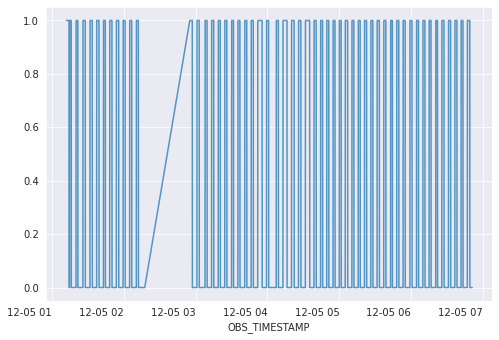

In [750]:
ax = noise_df.plot(x="OBS_TIMESTAMP", y="ID_TARGET", legend=False, figsize=(8, 6), alpha=0.75, rot=0)

This strategy does not seem to be a good idea and **won't be implemented on the preprocessed data**

## Normalization

The adopted normalization process places the selected features on a scale from 0 to 1, to standardize the data and treat the input of models that have normalized data as a premise.

In [751]:
preprocessed_data_df.drop(columns={"ID_ANNOTATION", "TARGET"}, inplace=True)
preprocessed_data_df.describe()

,TIMESTAMP,BDEP,HL,BHT,WOB,ID_TARGET
count,4.065100e+04,40651.000000,40651.000000,40651.000000,40651.000000,40651.000000
mean,1.607141e+12,4127.987250,322.500798,20.992985,109.278085,0.323830
std,5.871445e+06,566.035786,157.445478,13.364377,155.015235,0.467942
min,1.607131e+12,3055.281000,80.455998,1.694000,-10.760000,0.000000
25%,1.607136e+12,3636.986000,97.415997,7.633500,1.760000,0.000000
50%,1.607141e+12,4179.454000,394.127990,22.189000,6.600000,0.000000
75%,1.607146e+12,4610.241000,445.305988,33.096500,293.090000,1.000000
max,1.607151e+12,5063.135000,528.517986,39.987000,451.030000,1.000000


In [752]:
norm_columns=['BDEP', 'HL', 'BHT', 'WOB']
preprocessed_data_df[norm_columns] = minmax_scale(preprocessed_data_df[norm_columns])
preprocessed_data_df.head()

,TIMESTAMP,BDEP,HL,BHT,WOB,OBS_TIMESTAMP,ID_TARGET
0,1.607131e+12,1.000000,0.986578,0.451466,0.052275,2020-12-05 01:12:00.314,1
1,1.607131e+12,1.000000,0.988042,0.453712,0.050867,2020-12-05 01:12:00.822,1
2,1.607131e+12,0.999912,0.990903,0.456219,0.048095,2020-12-05 01:12:01.329,1
3,1.607131e+12,0.999912,0.992269,0.458439,0.046775,2020-12-05 01:12:01.838,1
4,1.607131e+12,0.999822,0.994563,0.460998,0.044544,2020-12-05 01:12:02.346,1


Creating a column with a normalized version of timestamp

In [753]:
preprocessed_data_df['TIMESTAMP_NORM'] = minmax_scale(preprocessed_data_df['TIMESTAMP'])
preprocessed_data_df.head()

,TIMESTAMP,BDEP,HL,BHT,WOB,OBS_TIMESTAMP,ID_TARGET,TIMESTAMP_NORM
0,1.607131e+12,1.000000,0.986578,0.451466,0.052275,2020-12-05 01:12:00.314,1,0.000000
1,1.607131e+12,1.000000,0.988042,0.453712,0.050867,2020-12-05 01:12:00.822,1,0.000025
2,1.607131e+12,0.999912,0.990903,0.456219,0.048095,2020-12-05 01:12:01.329,1,0.000050
3,1.607131e+12,0.999912,0.992269,0.458439,0.046775,2020-12-05 01:12:01.838,1,0.000075
4,1.607131e+12,0.999822,0.994563,0.460998,0.044544,2020-12-05 01:12:02.346,1,0.000100


# Part III: Models

### Ensemble model: Random Forest

In [754]:
rf_df = preprocessed_data_df.drop(columns={"OBS_TIMESTAMP", "TIMESTAMP"})
rf_df.head()

,BDEP,HL,BHT,WOB,ID_TARGET,TIMESTAMP_NORM
0,1.000000,0.986578,0.451466,0.052275,1,0.000000
1,1.000000,0.988042,0.453712,0.050867,1,0.000025
2,0.999912,0.990903,0.456219,0.048095,1,0.000050
3,0.999912,0.992269,0.458439,0.046775,1,0.000075
4,0.999822,0.994563,0.460998,0.044544,1,0.000100


**Splitting the data**

Splitting the dataset into train and test sets using the holdout technique, choosing 70% for the train and 30% for the test set. The division of the data will keep the natural proportion of the class, through the `stratify` parameter.

In [755]:
X = rf_df.drop('ID_TARGET', axis=1)
Y = rf_df['ID_TARGET']

xTrain, xTest, yTrain, yTest = train_test_split(X, Y, test_size=0.30, stratify=Y, shuffle=True)
# xTrain, xTest, yTrain, yTest = train_test_split(X, Y, test_size=0.20, stratify=Y)
# xTrain, xVal, yTrain, yVal = train_test_split(xTrain, yTrain, test_size=0.10, stratify=yTrain)

Method with the metrics that will be calculated

In [756]:
def calculateClassificationMetrics(test, prediction):
    print("Accuracy: %s"%metrics.accuracy_score(test, prediction))
    print("Precision - Micro: %s"%metrics.precision_score(test, prediction, average='micro'))
    print("Precision - Macro: %s"%metrics.precision_score(test, prediction, average='macro'))
    print("Recall - Micro: %s"%metrics.recall_score(test, prediction, average='micro'))
    print("Recall - Macro: %s"%metrics.recall_score(test, prediction, average='macro'))
    print("F1 - Micro: %s"%metrics.f1_score(test, prediction, average='micro'))
    print("F1 - Macro: %s"%metrics.f1_score(test, prediction, average='macro'))
    print("\n")

rf_clf = RandomForestClassifier(n_estimators=10, max_depth=3)
rf_clf.fit(xTrain, yTrain)
prediction = rf_clf.predict(xTest)
calculateClassificationMetrics(yTest, prediction)

Accuracy: 0.9930305018038701
Precision - Micro: 0.9930305018038701
Precision - Macro: 0.9924607275733774
Recall - Micro: 0.9930305018038701
Recall - Macro: 0.9916132858367614
F1 - Micro: 0.9930305018038701
F1 - Macro: 0.9920353537299504




In [757]:
print(metrics.classification_report(yTest, prediction, target_names=target_names))

              precision    recall  f1-score   support

   off_slips       0.99      1.00      0.99      8247
    on_slips       0.99      0.99      0.99      3949

    accuracy                           0.99     12196
   macro avg       0.99      0.99      0.99     12196
weighted avg       0.99      0.99      0.99     12196



In [758]:
metrics.confusion_matrix(yTest, prediction)

array([[8211,   36],
       [  49, 3900]])

This model is very successful to classify which are the slips’ state, with **99,16% of accuracy**

### Statistic Model: Logistic Regression

In [814]:
X_LR = preprocessed_data_df[['WOB','HL','BDEP']]
y_LR = preprocessed_data_df['ID_TARGET']

XTrain_LR, XTest_LR, yTrain_LR, yTest_LR = train_test_split(X_LR, y_LR, test_size=0.30, stratify=Y, shuffle=True)

In [815]:
classifier_LR = LogisticRegression()
model_LR = classifier_LR.fit(XTrain_LR, yTrain_LR)
y_pred_LR = model_LR.predict(XTest_LR)

In [816]:
model_LR.score(XTest_LR, yTest_LR)

0.9826992456543129

In [817]:
metrics.confusion_matrix(yTest_LR, y_pred_LR)

array([[8179,   68],
       [ 143, 3806]])

In [818]:
model_LR.intercept_

array([-5.98843123])

In [819]:
model_LR.coef_

array([[14.33962151, -0.19420311,  2.23619922]])

In [765]:
# print('Equation: log(P/1-P) = β0 + β1 * x1 + β2 * x2 + ... + βn * xn')
# print('in this case: log(P/1-P) = β0 + βwob * WOB + βhl * HL + βbdep * BDEP')
# print('or : log(P/1-P) = -0.00077719 + 0.01307709 * WOB + -0.01507805 * HL  + 0.00053014 * BDEP')

This model was very successful too, but a little less than Random Forest, but using less features too,  with a **score of 98,26%**

### Recurrent Network: LSTM

In [820]:
preprocessed_data_df.head()

,TIMESTAMP,BDEP,HL,BHT,WOB,OBS_TIMESTAMP,ID_TARGET,TIMESTAMP_NORM
0,1.607131e+12,1.000000,0.986578,0.451466,0.052275,2020-12-05 01:12:00.314,1,0.000000
1,1.607131e+12,1.000000,0.988042,0.453712,0.050867,2020-12-05 01:12:00.822,1,0.000025
2,1.607131e+12,0.999912,0.990903,0.456219,0.048095,2020-12-05 01:12:01.329,1,0.000050
3,1.607131e+12,0.999912,0.992269,0.458439,0.046775,2020-12-05 01:12:01.838,1,0.000075
4,1.607131e+12,0.999822,0.994563,0.460998,0.044544,2020-12-05 01:12:02.346,1,0.000100


Setting the timestamp as the dataframe index

In [821]:
lstm_df = preprocessed_data_df.copy()
lstm_df.index = lstm_df['OBS_TIMESTAMP']
lstm_df.drop(columns={'OBS_TIMESTAMP', 'TIMESTAMP', 'TIMESTAMP_NORM'}, inplace=True)
lstm_df.index.name = 'DATE'
lstm_df.head()

,BDEP,HL,BHT,WOB,ID_TARGET
DATE,,,,,
2020-12-05 01:12:00.314,1.000000,0.986578,0.451466,0.052275,1
2020-12-05 01:12:00.822,1.000000,0.988042,0.453712,0.050867,1
2020-12-05 01:12:01.329,0.999912,0.990903,0.456219,0.048095,1
2020-12-05 01:12:01.838,0.999912,0.992269,0.458439,0.046775,1
2020-12-05 01:12:02.346,0.999822,0.994563,0.460998,0.044544,1


In [824]:
values = lstm_df.values
type(values)

numpy.ndarray

In [826]:
values = values.astype('float32')
scaled = minmax_scale(feature_range=(0, 1), X=values)

**Creating the windows lags**

In [827]:
# Method from https://machinelearningmastery.com
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = pd.DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg

In [828]:
reframed = series_to_supervised(values, 1, 2)
reframed.head()

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var1(t+1),var2(t+1),var3(t+1),var4(t+1),var5(t+1)
1,1.000000,0.986578,0.451466,0.052275,1.0,1.000000,0.988042,0.453712,0.050867,1.0,0.999912,0.990903,0.456219,0.048095,1.0
2,1.000000,0.988042,0.453712,0.050867,1.0,0.999912,0.990903,0.456219,0.048095,1.0,0.999912,0.992269,0.458439,0.046775,1.0
3,0.999912,0.990903,0.456219,0.048095,1.0,0.999912,0.992269,0.458439,0.046775,1.0,0.999822,0.994563,0.460998,0.044544,1.0
4,0.999912,0.992269,0.458439,0.046775,1.0,0.999822,0.994563,0.460998,0.044544,1.0,0.999822,0.995545,0.460998,0.043591,1.0
5,0.999822,0.994563,0.460998,0.044544,1.0,0.999822,0.995545,0.460998,0.043591,1.0,0.999732,0.996536,0.465777,0.042617,1.0


**Deleting the columns that don't correspond to the target feature**

In [829]:
reframed.drop(reframed.columns[[5, 6, 7, 8]], axis=1, inplace=True)
print(reframed.head())

   var1(t-1)  var2(t-1)  var3(t-1)  var4(t-1)  var5(t-1)  var5(t)  var1(t+1)  \
1   1.000000   0.986578   0.451466   0.052275        1.0      1.0   0.999912   
2   1.000000   0.988042   0.453712   0.050867        1.0      1.0   0.999912   
3   0.999912   0.990903   0.456219   0.048095        1.0      1.0   0.999822   
4   0.999912   0.992269   0.458439   0.046775        1.0      1.0   0.999822   
5   0.999822   0.994563   0.460998   0.044544        1.0      1.0   0.999732   

   var2(t+1)  var3(t+1)  var4(t+1)  var5(t+1)  
1   0.990903   0.456219   0.048095        1.0  
2   0.992269   0.458439   0.046775        1.0  
3   0.994563   0.460998   0.044544        1.0  
4   0.995545   0.460998   0.043591        1.0  
5   0.996536   0.465777   0.042617        1.0  


In [830]:
values2 = reframed.values

# 1 min of observations = 60 seconds * 2 (samples rate)
thirty_min = 30*60*2

train = values2[:thirty_min, :]
test = values2[thirty_min:, :]

In [831]:
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]

# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(3600, 1, 10) (3600,) (37049, 1, 10) (37049,)


**Creating the recurrent network**

In [832]:
lstm_model = Sequential()
lstm_model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
lstm_model.add(Dense(1))
lstm_model.compile(loss='mae', optimizer='adam')

**Fitting the network**

In [833]:
history = lstm_model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
50/50 - 4s - loss: 0.3919 - val_loss: 0.2387 - 4s/epoch - 78ms/step
Epoch 2/50
50/50 - 1s - loss: 0.2048 - val_loss: 0.1029 - 1s/epoch - 28ms/step
Epoch 3/50
50/50 - 1s - loss: 0.0710 - val_loss: 0.0572 - 857ms/epoch - 17ms/step
Epoch 4/50
50/50 - 1s - loss: 0.0673 - val_loss: 0.0467 - 1s/epoch - 28ms/step
Epoch 5/50
50/50 - 1s - loss: 0.0655 - val_loss: 0.0474 - 859ms/epoch - 17ms/step
Epoch 6/50
50/50 - 1s - loss: 0.0528 - val_loss: 0.0542 - 1s/epoch - 28ms/step
Epoch 7/50
50/50 - 1s - loss: 0.0471 - val_loss: 0.0449 - 1s/epoch - 28ms/step
Epoch 8/50
50/50 - 1s - loss: 0.0431 - val_loss: 0.0465 - 870ms/epoch - 17ms/step
Epoch 9/50
50/50 - 1s - loss: 0.0408 - val_loss: 0.0396 - 844ms/epoch - 17ms/step
Epoch 10/50
50/50 - 1s - loss: 0.0289 - val_loss: 0.0272 - 861ms/epoch - 17ms/step
Epoch 11/50
50/50 - 1s - loss: 0.0325 - val_loss: 0.0310 - 1s/epoch - 28ms/step
Epoch 12/50
50/50 - 1s - loss: 0.0259 - val_loss: 0.0301 - 1s/epoch - 28ms/step
Epoch 13/50
50/50 - 1s - loss: 0.0

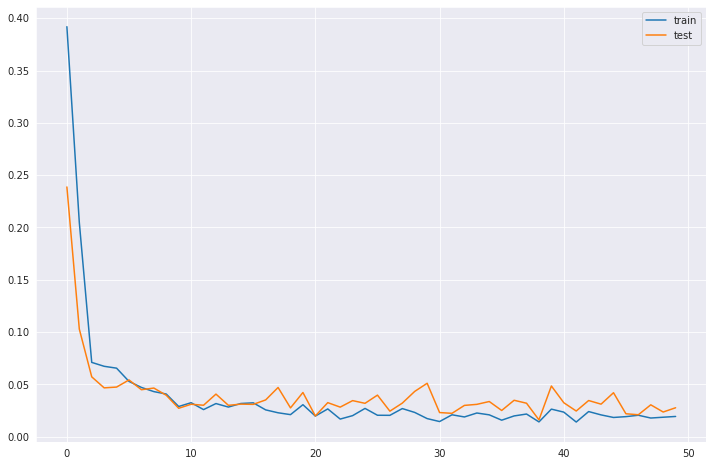

In [834]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [835]:
yhat = lstm_model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))

1158/1158 [==============================] - 2s 2ms/step


In [836]:
# invert scaling for forecast
inv_yhat = np.concatenate((yhat, test_X[:, 1:]), axis=1)
# inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]

# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = np.concatenate((test_y, test_X[:, 1:]), axis=1)
# inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]

# calculate RMSE
rmse = sqrt(metrics.mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 0.063


In [837]:
'''
from sklearn doc.:  Best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). 
In the general case when the true y is non-constant, a constant model that always predicts the average y 
disregarding the input features would get a  score of 0.0.
'''
metrics.r2_score(inv_y, inv_yhat)

0.9819419715531321

In [838]:
metrics.mean_squared_error(inv_y, inv_yhat)

0.0039249123

This model had a great R2 score, but can be improved, with some different approaches in preprocessing step or in the choice of the hyperparameters for instance.

# DRAFT

#### WOE & IV

**VERIFICAR:**<br>
`BDEP` feature doesn't seem to be relevant to determine the class. Let's see the weight and information value of these features to find if `BDEP` can be desconsidered for example.

**Weight of Evidence (WOE) and Information Value (IV)**

In [782]:
def Woe_IV_cont(df, features, target):    
    aux = features + [target]  
    df = df[aux].copy()
    
    # empty dataframe
    df_woe_iv = pd.DataFrame({},index=[])
    
    # quantity of values with occurrence
    _t1 = sum(df[target])
    # quantity of values without occurrence
    _t0 =  len(df[target]) - _t1
    
    # Percentile of continuous variables
    quantil = df.iloc[:, :-1].quantile([.1, .2, .3, .4, .5, .6, .7, .8, .9], axis = 0)
    
    for column in quantil.columns:
        # Non-duplicated quantile limit values
        aux_list = quantil[[column]].drop_duplicates().to_numpy()
        _tiv = 0
        
        for q in range(len(aux_list)):
            if q>0:
                localizacao = df[(df.loc[:,column] > float(aux_list[q-1])) & (df.loc[:,column] <= float(aux_list[q]))].index
                limit = str(aux_list[q-1]) + ' a ' + str(aux_list[q])
            else:
                localizacao = df[(df.loc[:,column] <= float(aux_list[q]))].index
                limit = '<=' + str(aux_list[q])
                
            population = len(localizacao)  
            
            # with occurrence
            _1 = sum(df.loc[localizacao,target])
            _p1 = _1/_t1

            # without occurrence
            _0 = population - _1
            _p0 = _0/_t0
            
            # Relative risk 
            if _p1 == 0 or _p0 == 0:
                _RR = 1
            else:
                _RR = _p1/_p0
            
            # Weight of evidence
            _woe = np.log(_RR)
            
            # Information value
            _iv = round(_woe*(_p1-_p0),2)
            
            # total Information value
            _tiv = _tiv+_iv

            dframe = pd.DataFrame({'feature':column , 'limit':limit , '0': _p0 , '1': _p1, 'RR':_RR, 'WoE': _woe , 'IV':  _iv}
                                  , index = [column])  
            
            df_woe_iv = pd.concat([df_woe_iv, dframe], ignore_index=True)
            
        dframe = pd.DataFrame({'feature':column ,'limit': ' ' , '0': 1 , '1': 1, 'RR': 1 , 'WoE': 0 , 'IV':  _tiv}
                                  , index =[column])
        
        df_woe_iv = pd.concat([df_woe_iv, dframe], ignore_index=True)
    return df_woe_iv

In [783]:
selected_features = ['BDEP', 'HL', 'BHT', 'WOB', 'TPO']

Woe_IV_cont(df=data_df, features=selected_features, target='ID_TARGET')

,feature,limit,0,1,RR,WoE,IV
0,BDEP,<=[3300.1076],0.102611,0.094602,0.921948,-0.081266,0.00
1,BDEP,[3300.1076] a [3526.864],0.102138,0.105231,1.030284,0.029835,0.00
2,BDEP,[3526.864] a [3757.336],0.098102,0.094298,0.961225,-0.039546,0.00
3,BDEP,[3757.336] a [4001.6978],0.102829,0.093994,0.914085,-0.089831,0.00
4,BDEP,[4001.6978] a [4179.829],0.091812,0.117227,1.276825,0.244377,0.01
5,BDEP,[4179.829] a [4397.842],0.095120,0.110166,1.158178,0.146848,0.00
6,BDEP,[4397.842] a [4597.812],0.104720,0.099916,0.954133,-0.046952,0.00
7,BDEP,[4597.812] a [4635.444],0.119409,0.087617,0.733750,-0.309587,0.01
8,BDEP,[4635.444] a [4842.479],0.090721,0.081391,0.897160,-0.108521,0.00
9,BDEP,,1.000000,1.000000,1.000000,0.000000,0.02


💡 **Some insights:**


- `BDEP`: IV = 0.02, which indicates that this feature is useless for prediction and their WOE is closer to zero, so this feature doesn't have weight on prediction

- `HL`: The IV is not useful but looking at the WOE values, we can see that from line 13 onwards their values are very close to -1 indicating a strong weight to predict the target 0, that is the `off_slips` state

- `BHT`: 

- `WOB`: 

#### Prophet

In [784]:
! python -m pip install prophet -q

In [785]:
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly

In [786]:
prophet_df = pd.DataFrame()
prophet_df['y'] = data_df['ID_TARGET']
prophet_df['ds'] = data_df['OBS_TIMESTAMP']

m = Prophet()
m.fit(prophet_df)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpi16b65ji/yaqg1cl0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpi16b65ji/u3avgred.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92622', 'data', 'file=/tmp/tmpi16b65ji/yaqg1cl0.json', 'init=/tmp/tmpi16b65ji/u3avgred.json', 'output', 'file=/tmp/tmpi16b65ji/prophet_model8_9euq_j/prophet_model-20230125053654.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:36:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:37:07 - cmdstanpy - INFO - Chain 

In [787]:
future = m.make_future_dataframe(periods=1, freq='s')

In [788]:
future.tail()

,ds
40669,2020-12-05 06:50:58.112
40670,2020-12-05 06:50:58.620
40671,2020-12-05 06:50:59.128
40672,2020-12-05 06:50:59.636
40673,2020-12-05 06:51:00.636


In [789]:
future.head()

,ds
0,2020-12-05 01:12:00.314
1,2020-12-05 01:12:00.822
2,2020-12-05 01:12:01.329
3,2020-12-05 01:12:01.838
4,2020-12-05 01:12:02.346


In [790]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
40669,2020-12-05 06:50:58.112,0.310505,-0.305549,0.927180
40670,2020-12-05 06:50:58.620,0.310504,-0.319342,0.904801
40671,2020-12-05 06:50:59.128,0.310503,-0.311798,0.911222
40672,2020-12-05 06:50:59.636,0.310502,-0.241958,0.916598
40673,2020-12-05 06:51:00.636,0.310500,-0.295106,0.855594


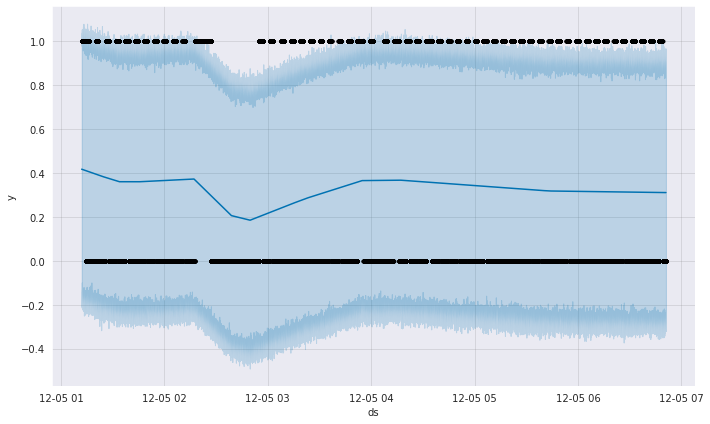

In [791]:
fig1 = m.plot(forecast)


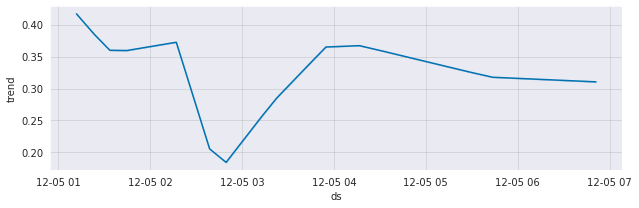

In [792]:
fig2 = m.plot_components(forecast)

In [793]:
plot_plotly(m, forecast)

In [794]:
plot_components_plotly(m, forecast)

#### UNFINISHED: Exploring the time series properties

**QUESTIONS INVOLVING TIME SERIES:**

*   Does this data has a trend?
*   Does this data contain any sort of pattern or seasonality?
*   Is the data stationary or non-stationary?





In [795]:
decomp_df = data_df.copy()
decomp_df = decomp_df[['OBS_TIMESTAMP', 'ID_TARGET']]
decomp_df.index = decomp_df['OBS_TIMESTAMP']
decomp_df.drop(columns={"OBS_TIMESTAMP"}, inplace=True)
decomp_df.head()

,ID_TARGET
OBS_TIMESTAMP,
2020-12-05 01:12:00.314,1
2020-12-05 01:12:00.822,1
2020-12-05 01:12:01.329,1
2020-12-05 01:12:01.838,1
2020-12-05 01:12:02.346,1


Seasonal decomposition of our target feature using an additive model (We can't apply a multiplicative model because there are negative and zero numbers in our dataset).

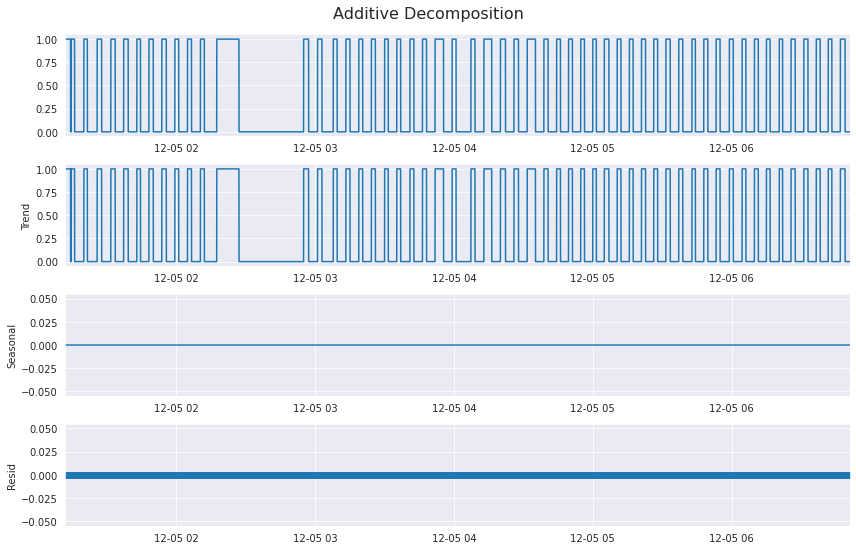

In [796]:
decomposition_1 = seasonal_decompose(x=decomp_df.asfreq('ms').dropna(), period=1)

plt.rcParams.update({'figure.figsize': (12,8)})
decomposition_1.plot().suptitle('Additive Decomposition', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

By the decomposition plot above, the target doesn't present seasonality or residue, but this assumption needs to be checked.

In [797]:
# ! pip install statsmodels
# ! pip install tsfresh

In [798]:
# from tsfresh import extract_relevant_features
# from tsfresh.examples.robot_execution_failures import load_robot_execution_failures

# timeseries, y = load_robot_execution_failures()

In [ ]:
# !pip install cesium

In [ ]:
# from cesium import featurize.featurize_time_series as ft
# from cesium import featurize

Self-correlation

Let's measure the correlation of our target feature if the default lag (equal 1), to see if the class of a register is influenced by the class of the previous one.

In [799]:
data_df['ID_TARGET'].autocorr(lag=2)

0.9877601282996432

The target has a strong positive correlation, being closer to 1

[]

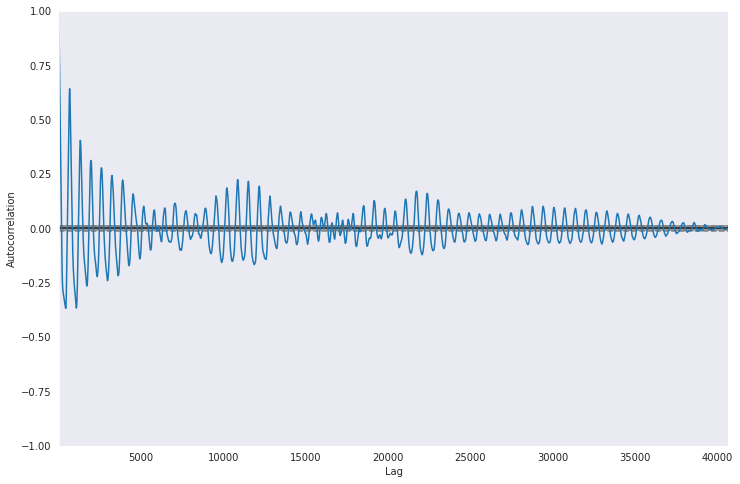

In [800]:
x = pd.plotting.autocorrelation_plot(data_df['ID_TARGET'])
x.plot()


Verifing if the time series is stacionary

In [801]:
adfuller_test = adfuller(data_df['ID_TARGET'], autolag='AIC')
print(f'ADF Statistic: {adfuller_test[0]}')
print(f'n_lags: {adfuller_test[1]}')
print(f'p-value: {adfuller_test[1]}')

for key, value in adfuller_test[4].items():
    print('Critical Values:')
    print(f'   {key}, {value}')  

ADF Statistic: -11.208715490866776
n_lags: 2.1521897497387263e-20
p-value: 2.1521897497387263e-20
Critical Values:
   1%, -3.4305107915215474
Critical Values:
   5%, -2.861611066191122
Critical Values:
   10%, -2.5668078262456904


As the p-value is less than the significant level (0.05)

In [802]:
adfuller_test

(-11.208715490866776,
 2.1521897497387263e-20,
 0,
 40672,
 {'1%': -3.4305107915215474,
  '5%': -2.861611066191122,
  '10%': -2.5668078262456904},
 -125336.44412734496)